## Applied Machine Learning: HW-4

In [1]:
# Importing required packages
import pandas as pd
import numpy as np
from sklearn.cluster import KMeans , AgglomerativeClustering , DBSCAN
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import scale, StandardScaler, MinMaxScaler
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
from matplotlib import colors
plt.rcParams["savefig.dpi"] = 300
plt.rcParams["savefig.bbox"] = "tight"
np.set_printoptions(precision=3, suppress=True)
import scipy.io
from mpl_toolkits.mplot3d import Axes3D
import itertools
from sklearn.metrics import adjusted_rand_score, silhouette_score, normalized_mutual_info_score, adjusted_mutual_info_score , roc_auc_score , average_precision_score

from scipy.cluster.hierarchy import dendrogram, linkage
from sklearn.svm import OneClassSVM

In [2]:
# Importing training and test datasets
ann_data = scipy.io.loadmat("annthyroid.mat")
ann_X = pd.DataFrame(ann_data['X'])
ann_y = pd.DataFrame(ann_data['y'])

print("Shape of X data = {}".format(ann_X.shape))
print("Shape of y data = {} \n \n".format(ann_y.shape))

print("Head of the feature dataset \n")
print(ann_X.head())

Shape of X data = (7200, 6)
Shape of y data = (7200, 1) 
 

Head of the feature dataset 

      0        1      2      3      4      5
0  0.73  0.00060  0.015  0.120  0.082  0.146
1  0.24  0.00025  0.030  0.143  0.133  0.108
2  0.47  0.00190  0.024  0.102  0.131  0.078
3  0.64  0.00090  0.017  0.077  0.090  0.085
4  0.23  0.00025  0.026  0.139  0.090  0.153


#### Percentage of outliers in the data (ground truth)

In [3]:
ann_y[0].value_counts(normalize = True)*100

0    92.583333
1     7.416667
Name: 0, dtype: float64

In [4]:
# Looking at means and Standard deviation of attributes 
for cols in ann_X.columns:
    print("Column {} has mean = {:.2f}".format(cols,ann_X[cols].mean()))
    print("Column {} has SD = {:.2f} \n".format(cols,ann_X[cols].std()))
    
    
print("After scaling \n \n")

scaler = StandardScaler()
ann_X_scaled = pd.DataFrame(scaler.fit_transform(ann_X))

for cols in ann_X_scaled.columns:
    print("Column {} has mean = {:.2f}".format(cols,ann_X_scaled[cols].mean()))
    print("Column {} has SD = {:.2f} \n".format(cols,ann_X_scaled[cols].std()))

Column 0 has mean = 0.52
Column 0 has SD = 0.19 

Column 1 has mean = 0.00
Column 1 has SD = 0.02 

Column 2 has mean = 0.02
Column 2 has SD = 0.01 

Column 3 has mean = 0.11
Column 3 has SD = 0.04 

Column 4 has mean = 0.10
Column 4 has SD = 0.02 

Column 5 has mean = 0.11
Column 5 has SD = 0.04 

After scaling 
 

Column 0 has mean = 0.00
Column 0 has SD = 1.00 

Column 1 has mean = 0.00
Column 1 has SD = 1.00 

Column 2 has mean = 0.00
Column 2 has SD = 1.00 

Column 3 has mean = -0.00
Column 3 has SD = 1.00 

Column 4 has mean = 0.00
Column 4 has SD = 1.00 

Column 5 has mean = -0.00
Column 5 has SD = 1.00 



## Task-1: Analysing univariate disctributions

### Before scaling 

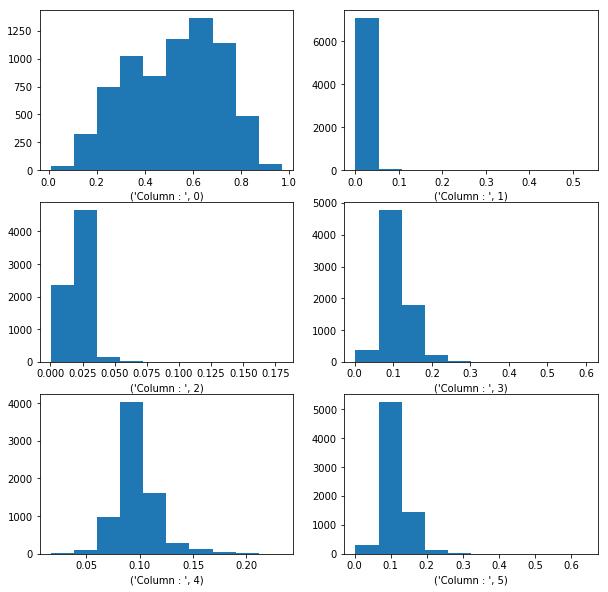

In [5]:
## jointly
plt.figure(figsize=(10,10))
for col in ann_X.columns:
    
    
    plt.subplot(3,2,int(col+1))
    plt.hist(ann_X[col])
    plt.xlabel(("Column : " ,col))

plt.show()

### After scaling

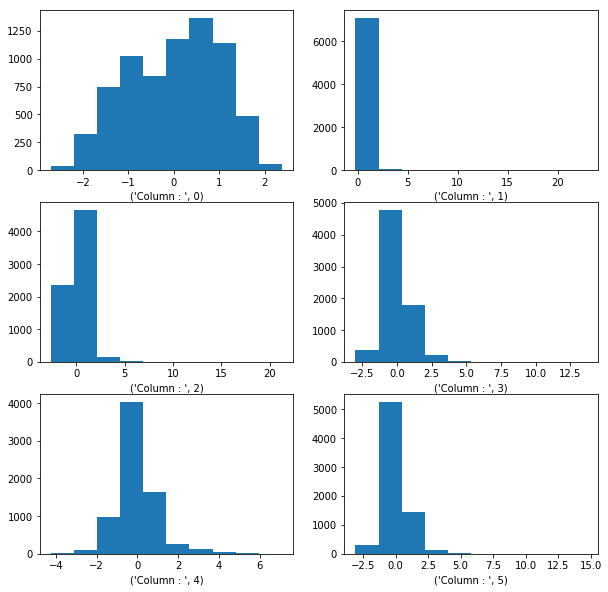

In [6]:
## jointly
plt.figure(figsize=(10,10))
for col in ann_X_scaled.columns:
    
    
    plt.subplot(3,2,int(col+1))
    plt.hist(ann_X_scaled[col])
    plt.xlabel(("Column : " ,col))

plt.show()


### Looking at two classes separately: Before scaling

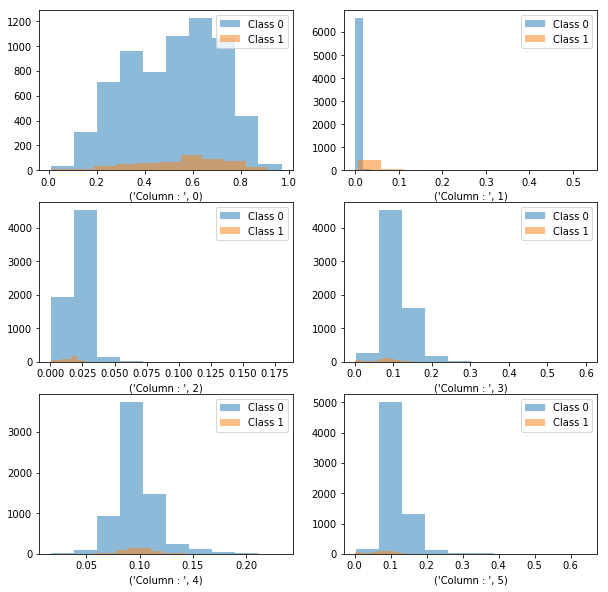

In [7]:
plt.figure(figsize=(10,10))
for col in ann_X.columns:
    
    
    plt.subplot(3,2,int(col+1))
    plt.hist(ann_X[col][ann_y[0]==0], alpha=0.5, label='Class 0')
    plt.hist(ann_X[col][ann_y[0]==1], alpha=0.5, label='Class 1')
    plt.legend(loc='upper right')
    plt.xlabel(("Column : " ,col))
plt.show()

### Looking at two classes separately:  After scaling

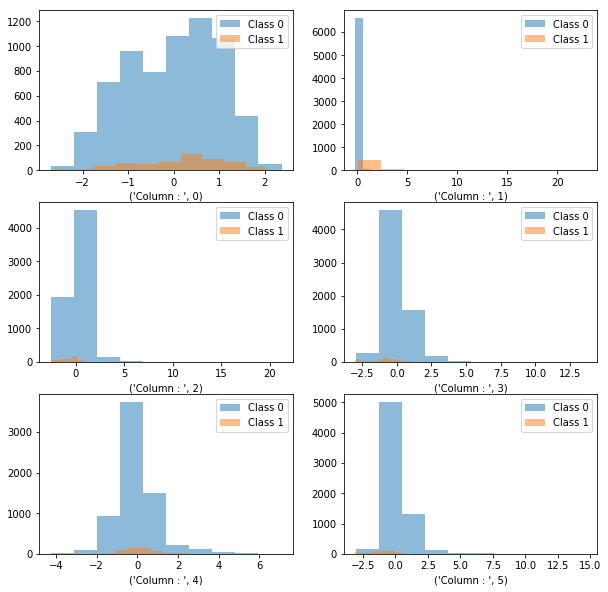

In [8]:
plt.figure(figsize=(10,10))
for col in ann_X_scaled.columns:
    
    
    plt.subplot(3,2,int(col+1))
    plt.hist(ann_X_scaled[col][ann_y[0]==0], alpha=0.5, label='Class 0')
    plt.hist(ann_X_scaled[col][ann_y[0]==1], alpha=0.5, label='Class 1')
    plt.legend(loc='upper right')
    plt.xlabel(("Column : " ,col))
plt.show()

## Analysis using PCA: Before scaling

Shape of original data = (7200, 6)
Shape after PCA = (7200, 2)
Explained variance ratio = [ 0.91   0.061]
Cummulative Explained variance ratio = [ 0.91   0.971]


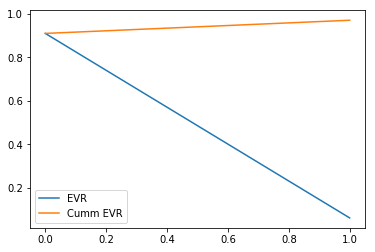

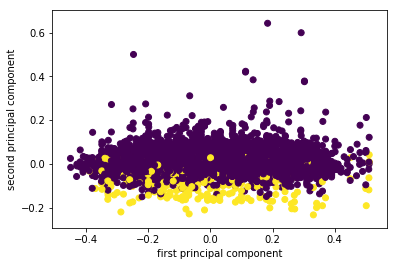

In [121]:
# 2 pricipal components
pca_2d_us = PCA(n_components=2, svd_solver='full')
ann_X_reduced_2d_us = pca_2d_us.fit_transform(ann_X) 
print("Shape of original data = {}".format(ann_X.shape))
print("Shape after PCA = {}".format(ann_X_reduced_2d_us.shape))
print("Explained variance ratio = {}".format(pca_2d_us.explained_variance_ratio_))
print("Cummulative Explained variance ratio = {}".format(pca_2d_us.explained_variance_ratio_.cumsum()))


plt.plot(pca_2d_us.explained_variance_ratio_, label="EVR")
plt.plot(pca_2d_us.explained_variance_ratio_.cumsum(), label="Cumm EVR")
plt.legend()
plt.show()


## Here 2 components are retaining 97% of the variance

plt.scatter(ann_X_reduced_2d_us[:, 0], ann_X_reduced_2d_us[:, 1] , c = ann_y[0])
plt.xlabel("first principal component")
plt.ylabel("second principal component")
plt.show()

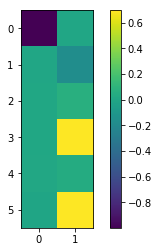

In [10]:
components_2d_us = pca_2d_us.components_
plt.imshow(components_2d_us.T)
plt.yticks(range(len(np.arange(0,6,1))), np.arange(0,6,1))
plt.colorbar()
plt.show()

### Looking at feature contribution to the principal components

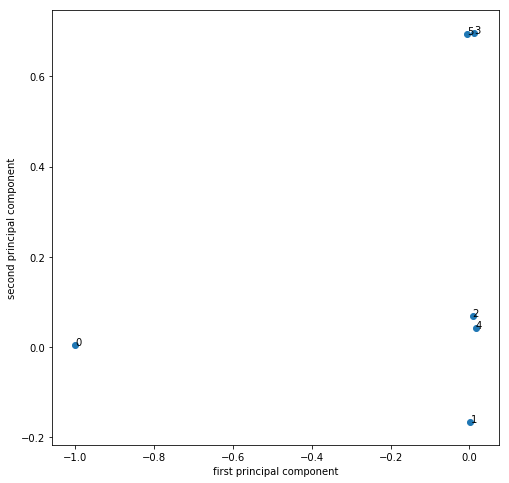

In [11]:
plt.figure(figsize=(8, 8))
plt.scatter(components_2d_us[0], components_2d_us[1])
for i, feature_contribution in enumerate(components_2d_us.T):
    plt.annotate(ann_X.columns[i], feature_contribution)
plt.xlabel("first principal component")
plt.ylabel("second principal component")
plt.show()

### Scatter plot before and after PCA

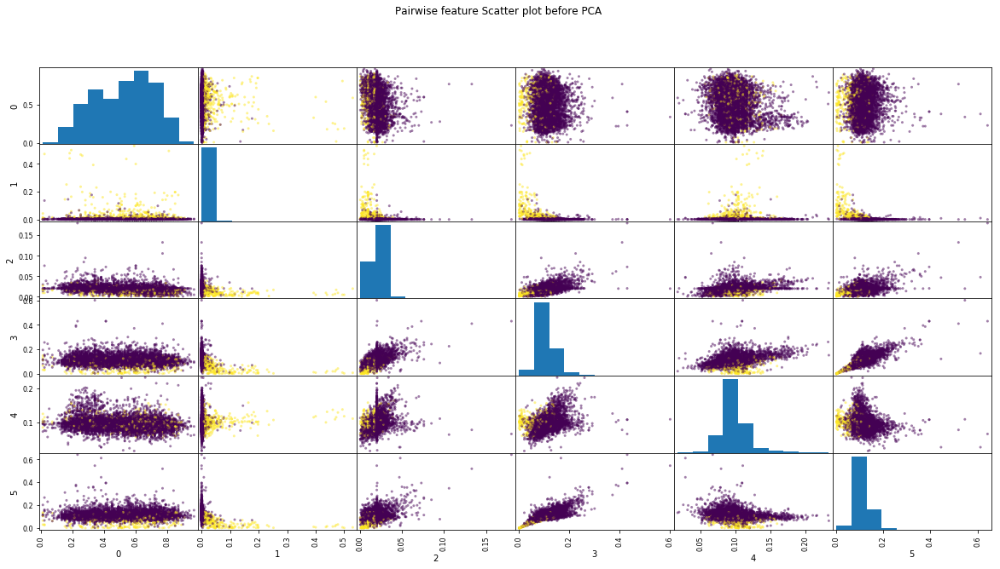

In [12]:
pd.plotting.scatter_matrix(ann_X, figsize=(20,10), c = ann_y[0])
plt.suptitle("Pairwise feature Scatter plot before PCA ")
plt.show()

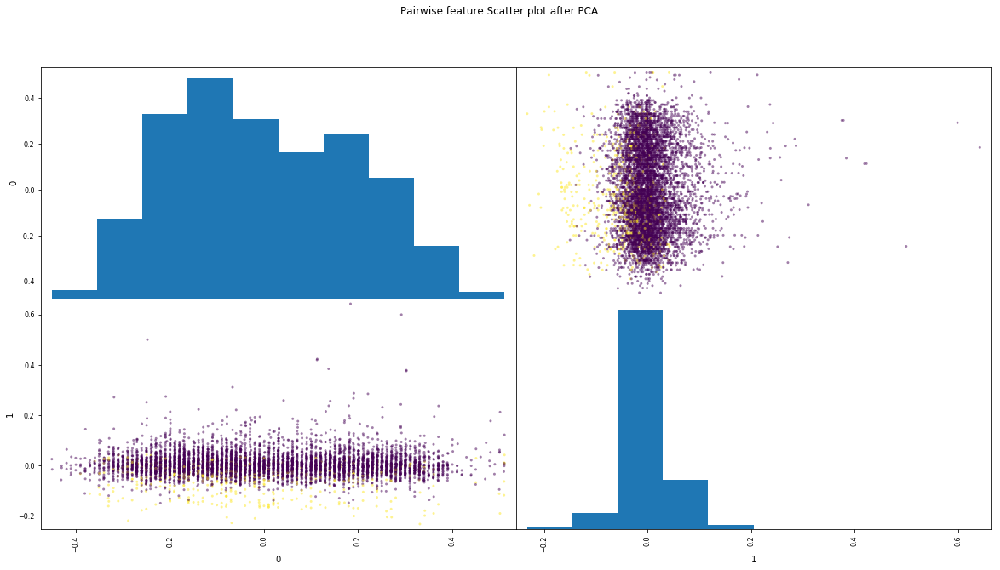

In [13]:
pd.plotting.scatter_matrix(pd.DataFrame(ann_X_reduced_2d_us), figsize=(20,10), c = ann_y[0])
plt.suptitle("Pairwise feature Scatter plot after PCA ")
plt.show()

## Analysis using PCA with scaled data


Shape of original data = (7200, 6)
Shape after PCA = (7200, 2)
Explained variance ratio = [ 0.383  0.231]
Cummulative Explained variance ratio = [ 0.383  0.613]


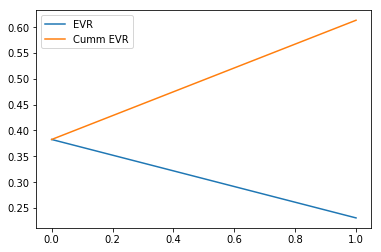

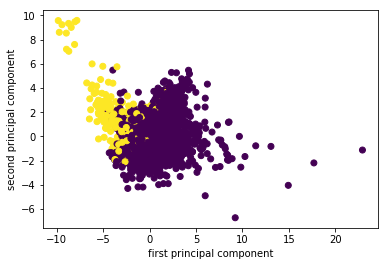

In [122]:
pca_2d = PCA(n_components=2, svd_solver='full')
ann_X_reduced_2d = pca_2d.fit_transform(ann_X_scaled) 
print("Shape of original data = {}".format(ann_X_scaled.shape))
print("Shape after PCA = {}".format(ann_X_reduced_2d.shape))
print("Explained variance ratio = {}".format(pca_2d.explained_variance_ratio_))
print("Cummulative Explained variance ratio = {}".format(pca_2d.explained_variance_ratio_.cumsum()))


## After scaling we see that only 61.3% of the variance is retained
plt.plot(pca_2d.explained_variance_ratio_, label="EVR")
plt.plot(pca_2d.explained_variance_ratio_.cumsum(), label="Cumm EVR")
plt.legend()
plt.show()

plt.scatter(ann_X_reduced_2d[:, 0], ann_X_reduced_2d[:, 1], c = ann_y[0])
plt.xlabel("first principal component")
plt.ylabel("second principal component")
plt.show()

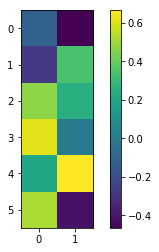

In [15]:
components_2d = pca_2d.components_
plt.imshow(components_2d.T)
plt.yticks(range(len(np.arange(0,6,1))), np.arange(0,6,1))
plt.colorbar()
plt.show()

### Looking at feature contributions to the principal components (scaled data)

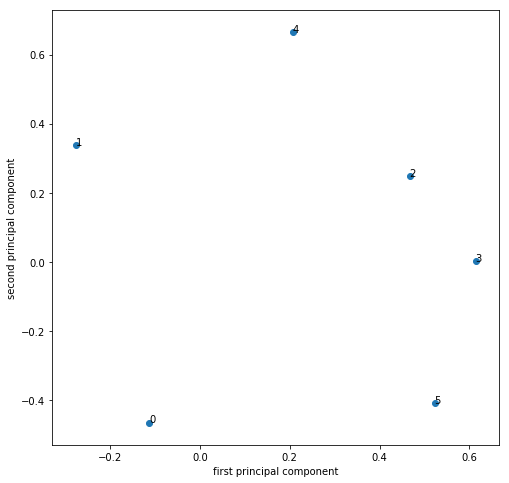

In [16]:
plt.figure(figsize=(8, 8))
plt.scatter(components_2d[0], components_2d[1])
for i, feature_contribution in enumerate(components_2d.T):
    plt.annotate(ann_X_scaled.columns[i], feature_contribution)
plt.xlabel("first principal component")
plt.ylabel("second principal component")
plt.show()

### Scatter plot before and after PCA (scaled data)

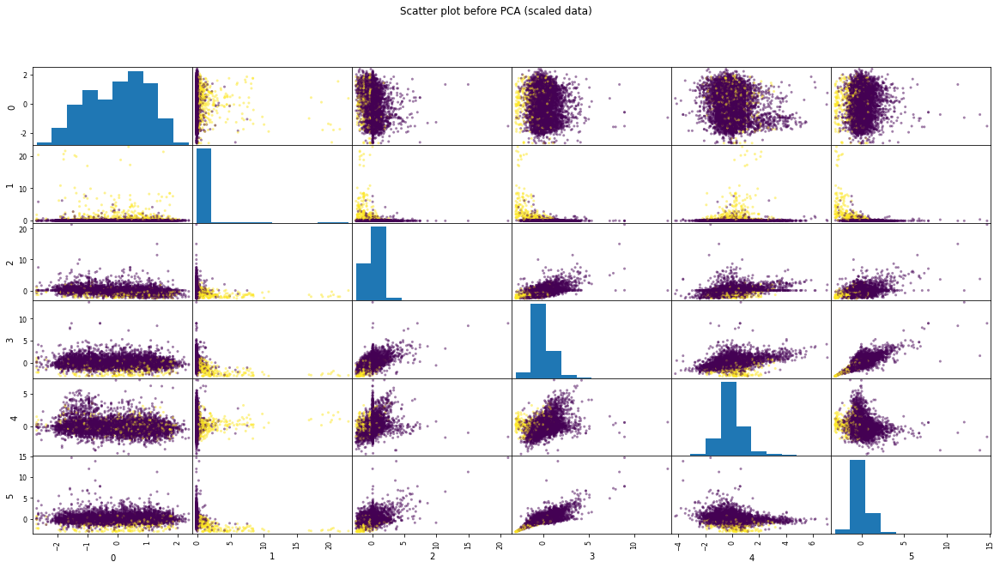

In [17]:
pd.plotting.scatter_matrix(ann_X_scaled , figsize=(20,10), c = ann_y[0])
plt.suptitle("Scatter plot before PCA (scaled data)")
plt.show()

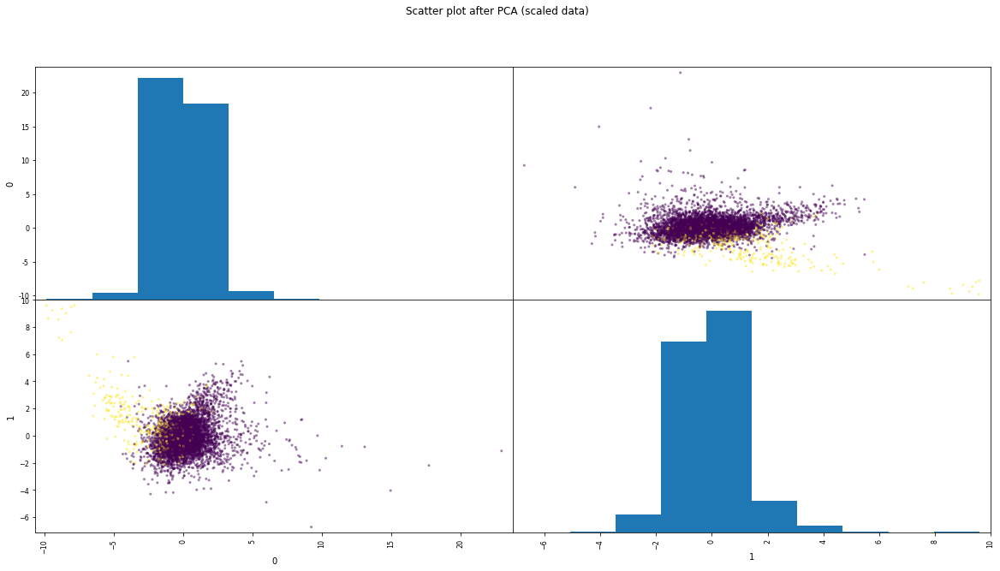

In [18]:
pd.plotting.scatter_matrix(pd.DataFrame(ann_X_reduced_2d),figsize=(20,10), c = ann_y[0])
plt.suptitle("Scatter plot after PCA (scaled data)")
plt.show()

### PCA with 3 components using original data

Shape of original data = (7200, 6)
Shape after PCA = (7200, 3)
Explained variance ratio = [ 0.91   0.061  0.016]
Cummulative Explained variance ratio = [ 0.91   0.971  0.987]


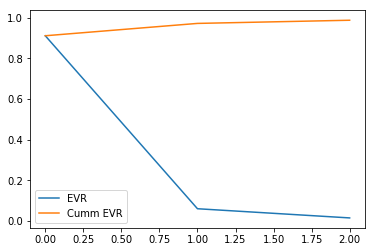

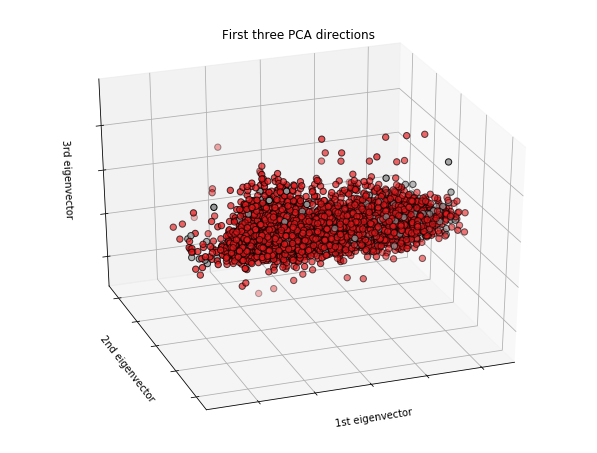

In [123]:
pca_3d_us = PCA(n_components=3, svd_solver='full')
ann_X_reduced_3d_us = pca_3d_us.fit_transform(ann_X) 

print("Shape of original data = {}".format(ann_X.shape))
print("Shape after PCA = {}".format(ann_X_reduced_3d_us.shape))
print("Explained variance ratio = {}".format(pca_3d_us.explained_variance_ratio_))
print("Cummulative Explained variance ratio = {}".format(pca_3d_us.explained_variance_ratio_.cumsum()))

## While using 3 components with unscaled data, we are retaining 98.7% variance
plt.plot(pca_3d_us.explained_variance_ratio_, label="EVR")
plt.plot(pca_3d_us.explained_variance_ratio_.cumsum(), label="Cumm EVR")
plt.legend()
plt.show()



fig = plt.figure(1, figsize=(8, 6))
ax = Axes3D(fig, elev=-150, azim=110)
ax.scatter(ann_X_reduced_3d_us[:, 0], ann_X_reduced_3d_us[:, 1], ann_X_reduced_3d_us[:, 2],
           cmap=plt.cm.Set1, c=ann_y[0], edgecolor='k', s=40)
ax.set_title("First three PCA directions")
ax.set_xlabel("1st eigenvector")
ax.w_xaxis.set_ticklabels([])
ax.set_ylabel("2nd eigenvector")
ax.w_yaxis.set_ticklabels([])
ax.set_zlabel("3rd eigenvector")
ax.w_zaxis.set_ticklabels([])
plt.show()



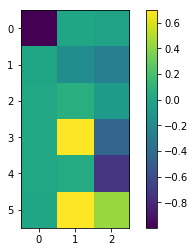

In [20]:
components_3d_us = pca_3d_us.components_
plt.imshow(components_3d_us.T)
plt.yticks(range(len(np.arange(0,6,1))), np.arange(0,6,1))
plt.colorbar()
plt.show()

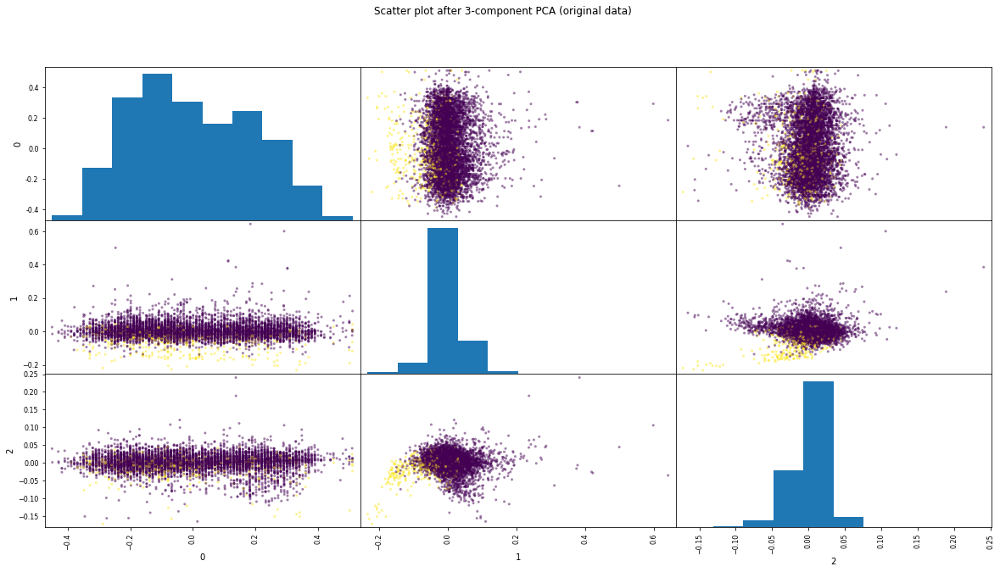

In [21]:
pd.plotting.scatter_matrix(pd.DataFrame(ann_X_reduced_3d_us),figsize=(20,10), c = ann_y[0])
plt.suptitle("Scatter plot after 3-component PCA (original data)")
plt.show()

### PCA with 3 components using scaled data

Shape of original data = (7200, 6)
Shape after PCA = (7200, 3)
Explained variance ratio = [ 0.383  0.231  0.152]
Cummulative Explained variance ratio = [ 0.383  0.613  0.765]


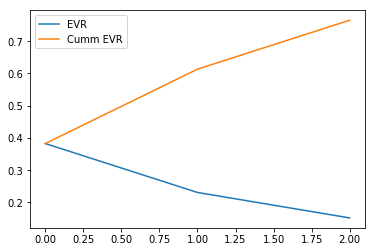

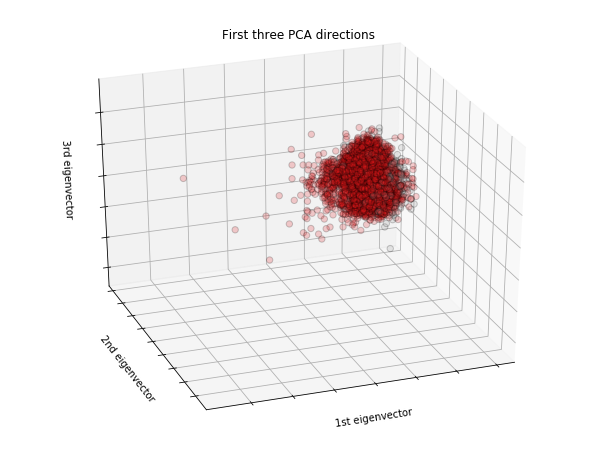

In [124]:
pca_3d = PCA(n_components=3, svd_solver='full')
ann_X_reduced_3d= pca_3d.fit_transform(ann_X_scaled) 

print("Shape of original data = {}".format(ann_X_scaled.shape))
print("Shape after PCA = {}".format(ann_X_reduced_3d.shape))
print("Explained variance ratio = {}".format(pca_3d.explained_variance_ratio_))
print("Cummulative Explained variance ratio = {}".format(pca_3d.explained_variance_ratio_.cumsum()))

## We see that after scaling of data, pca with 3 components give us a 76.5% retained variance

plt.plot(pca_3d.explained_variance_ratio_, label="EVR")
plt.plot(pca_3d.explained_variance_ratio_.cumsum(), label="Cumm EVR")
plt.legend()
plt.show()

fig = plt.figure(1, figsize=(8, 6))
ax = Axes3D(fig, elev=-150, azim=110)
ax.scatter(ann_X_reduced_3d[:, 0], ann_X_reduced_3d[:, 1], ann_X_reduced_3d[:, 2],
           cmap=plt.cm.Set1,c = ann_y[0], edgecolor='k', s=40, alpha = 0.2)
ax.set_title("First three PCA directions")
ax.set_xlabel("1st eigenvector")
ax.w_xaxis.set_ticklabels([])
ax.set_ylabel("2nd eigenvector")
ax.w_yaxis.set_ticklabels([])
ax.set_zlabel("3rd eigenvector")
ax.w_zaxis.set_ticklabels([])
plt.show()


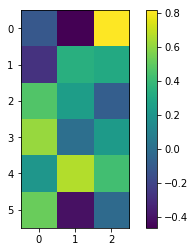

In [23]:
components_3d = pca_3d.components_
plt.imshow(components_3d.T)
plt.yticks(range(len(np.arange(0,6,1))), np.arange(0,6,1))
plt.colorbar()
plt.show()

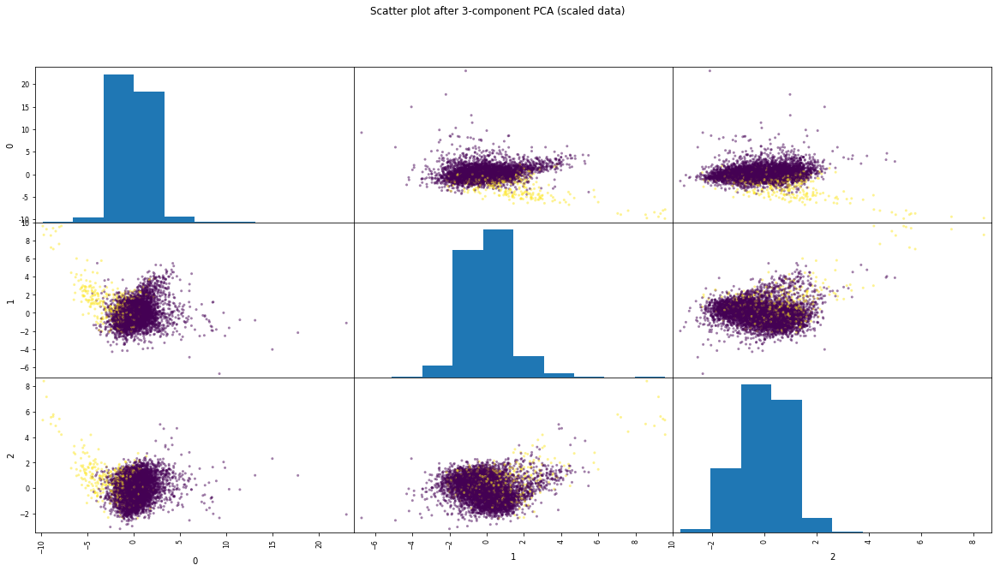

In [24]:
pd.plotting.scatter_matrix(pd.DataFrame(ann_X_reduced_3d),figsize=(20,10), c = ann_y[0])
plt.suptitle("Scatter plot after 3-component PCA (scaled data)")
plt.show()

### PCA with 4 components using original data

Shape of original data = (7200, 6)
Shape after PCA = (7200, 4)
Explained variance ratio = [ 0.91   0.061  0.016  0.012]
Cummulative Explained variance ratio = [ 0.91   0.971  0.987  0.998]


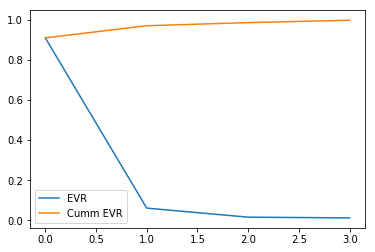

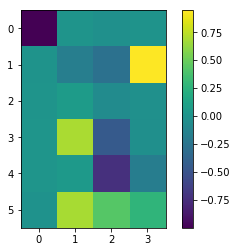

In [125]:
pca_4d_us = PCA(n_components=4, svd_solver='full')
ann_X_reduced_4d_us = pca_4d_us.fit_transform(ann_X) 
print("Shape of original data = {}".format(ann_X.shape))
print("Shape after PCA = {}".format(ann_X_reduced_4d_us.shape))
print("Explained variance ratio = {}".format(pca_4d_us.explained_variance_ratio_))
print("Cummulative Explained variance ratio = {}".format(pca_4d_us.explained_variance_ratio_.cumsum()))

## While using PCA with 4 components on unscaled data, we are getting 99.8% retainability
plt.plot(pca_4d_us.explained_variance_ratio_, label="EVR")
plt.plot(pca_4d_us.explained_variance_ratio_.cumsum(), label="Cumm EVR")
plt.legend()
plt.show()

components_4d_us = pca_4d_us.components_
plt.imshow(components_4d_us.T)
plt.yticks(range(len(np.arange(0,6,1))), np.arange(0,6,1))
plt.colorbar()
plt.show()

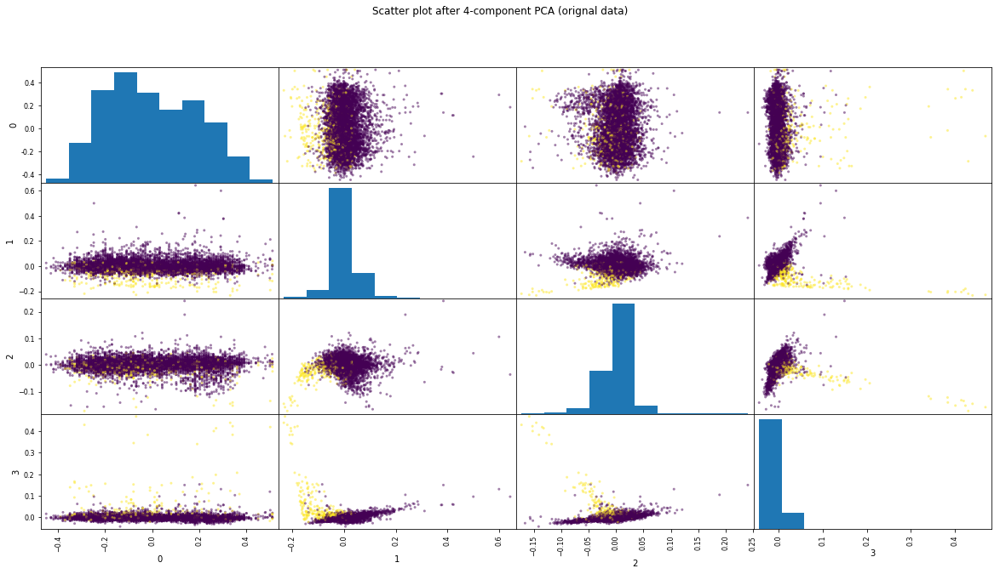

In [26]:
pd.plotting.scatter_matrix(pd.DataFrame(ann_X_reduced_4d_us),figsize=(20,10), c= ann_y[0])
plt.suptitle("Scatter plot after 4-component PCA (orignal data)")
plt.show()

### PCA with 4 components using scaled data

Shape of original data = (7200, 6)
Shape after PCA = (7200, 4)
Explained variance ratio = [ 0.383  0.231  0.152  0.135]
Cummulative Explained variance ratio = [ 0.383  0.613  0.765  0.901]


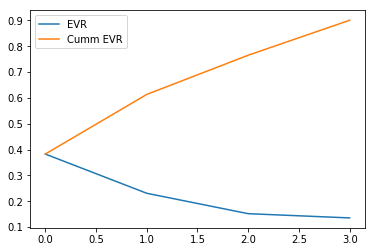

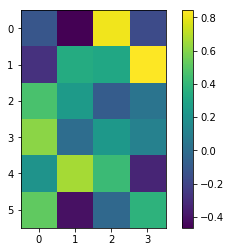

In [126]:
pca_4d = PCA(n_components=4, svd_solver='full')
ann_X_reduced_4d = pca_4d.fit_transform(ann_X_scaled) 
print("Shape of original data = {}".format(ann_X_scaled.shape))
print("Shape after PCA = {}".format(ann_X_reduced_4d.shape))
print("Explained variance ratio = {}".format(pca_4d.explained_variance_ratio_))
print("Cummulative Explained variance ratio = {}".format(pca_4d.explained_variance_ratio_.cumsum()))


## After scaling we get 90.1% retainability on 4 components
plt.plot(pca_4d.explained_variance_ratio_, label="EVR")
plt.plot(pca_4d.explained_variance_ratio_.cumsum(), label="Cumm EVR")
plt.legend()
plt.show()


components_4d = pca_4d.components_
plt.imshow(components_4d.T)
plt.yticks(range(len(np.arange(0,6,1))), np.arange(0,6,1))
plt.colorbar()
plt.show()

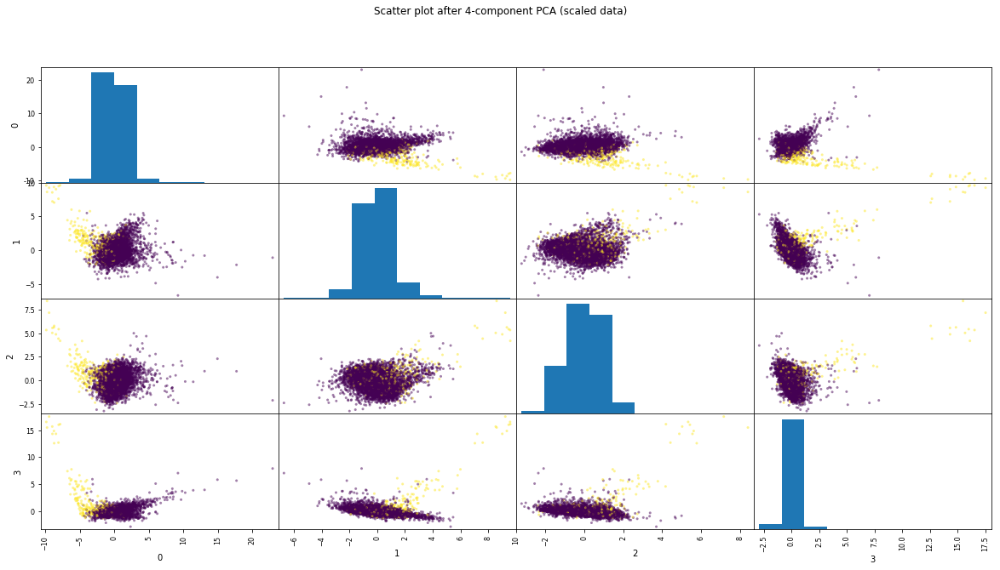

In [28]:
pd.plotting.scatter_matrix(pd.DataFrame(ann_X_reduced_4d),figsize=(20,10), c = ann_y[0])
plt.suptitle("Scatter plot after 4-component PCA (scaled data)")
plt.show()

## Understanding explained variance ratio

The explained variance ration depicts the variance that has been extracted by the reduced dimension from the original data. In cases where we have very large feature like 50+, and we are reducing the dimentionality to 2 or 3 dimensions, then it is obvious that the variance captured by each of the reduced features/principal component wont be very high , or in other words the cummulative EVR wont be very high. But in this case where we just had 6 features in the inital data, we are able to capture around 97% using 2 components and 99% using 3 components. 

Also when we scale the data, the variance automatically reduces and so does the expained variance ratio.

## Analysis using T-SNE

With perplexity :  5 


(7200, 2)


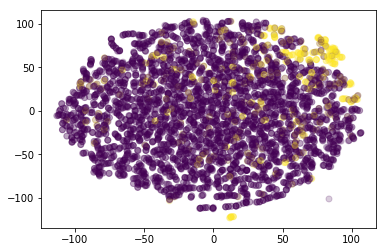

With perplexity :  15 


(7200, 2)


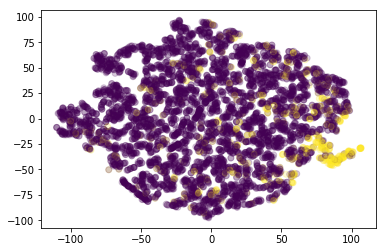

With perplexity :  25 


(7200, 2)


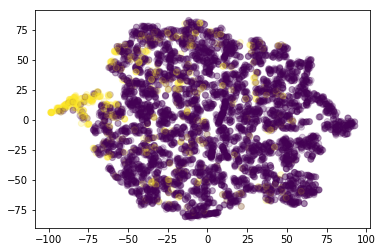

With perplexity :  35 


(7200, 2)


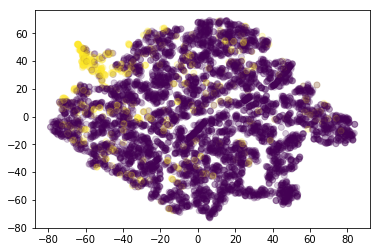

With perplexity :  45 


(7200, 2)


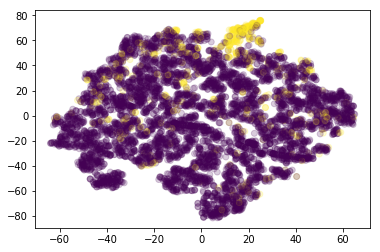

In [29]:
## TSNE WITH TUNING PERPLEXIITIES

from sklearn.manifold import TSNE
from sklearn.model_selection import GridSearchCV

for perp in np.arange(5,55,10):
    
    print("With perplexity : ", perp, "\n\n")
    ann_X_reduced_tsne = TSNE(n_components=2, perplexity=perp).fit_transform(ann_X_scaled)
    print(ann_X_reduced_tsne.shape)
    ann_vis_x = ann_X_reduced_tsne[:, 0]
    ann_vis_y = ann_X_reduced_tsne[:, 1]
    plt.scatter(ann_vis_x, ann_vis_y, c = ann_y[0], alpha = 0.2)
    plt.show()

## Explain if tuning the parameter helps

The perplexity is used just to visualize the data with a different perspective. Generally, a higher peeplexity gives a better visualization of the labels of the data, but it need not be the case with all data.

In the above graphs we see that with perplexity value=5, it was difficult to visualize both the labels, but when it increased to 15 and later, its easy to distiinguish the data labels. 

## Task 2: Clustering 

Here we try 3 Techniques for clustering K-Means, Agglomerative Clustering and DBSCAN. 
In case of agglomerative clustering we try all the three types of linkages "ward", "average" and "complete". 

In K_Means we try out cluster size from 2 to 5 with step size 1. 
In agglomerative clustering and  DBSCAN we try the cluster size from 3 to 5 with step size 1. 

We also measure the ARI, NMI and AMI in each of our approaches. 

In the last section we plot the ARI, NMI AMI trends with cluster size from 0 to 30 using the ground truth values to understand the optimal number of clusters in each of the approaches. 

### Task 2.1 

Here we change the cluster size of k-Means algorithms from 2 to 5 with step size of 1. We also note the cluster sizes in each of the cases.

Note: We initially did not use the truth values to figure the algortihms performance. To document we later added these entries.  

In [47]:
km = KMeans(n_clusters=2, random_state=0)
km.fit(ann_X_scaled)

print(km.cluster_centers_.shape)
print(km.labels_.shape)
print(km.score(ann_X_scaled))

ari = adjusted_rand_score(ann_y[0], km.labels_)
nmi = normalized_mutual_info_score(ann_y[0], km.labels_)
ami = adjusted_mutual_info_score(ann_y[0], km.labels_)

print("ARI: {:.2f} NMI: {:.2f} AMI: {:.2f}\n \n".format(ari, nmi, ami))

print("Cluster Size")
print(pd.Series(km.labels_).value_counts(normalize = True)*100)

(2, 6)
(7200,)
-35401.8381629
ARI: -0.05 NMI: 0.03 AMI: 0.02
 

Cluster Size
0    74.277778
1    25.722222
dtype: float64


### Pairwise scatter plot to see clustering

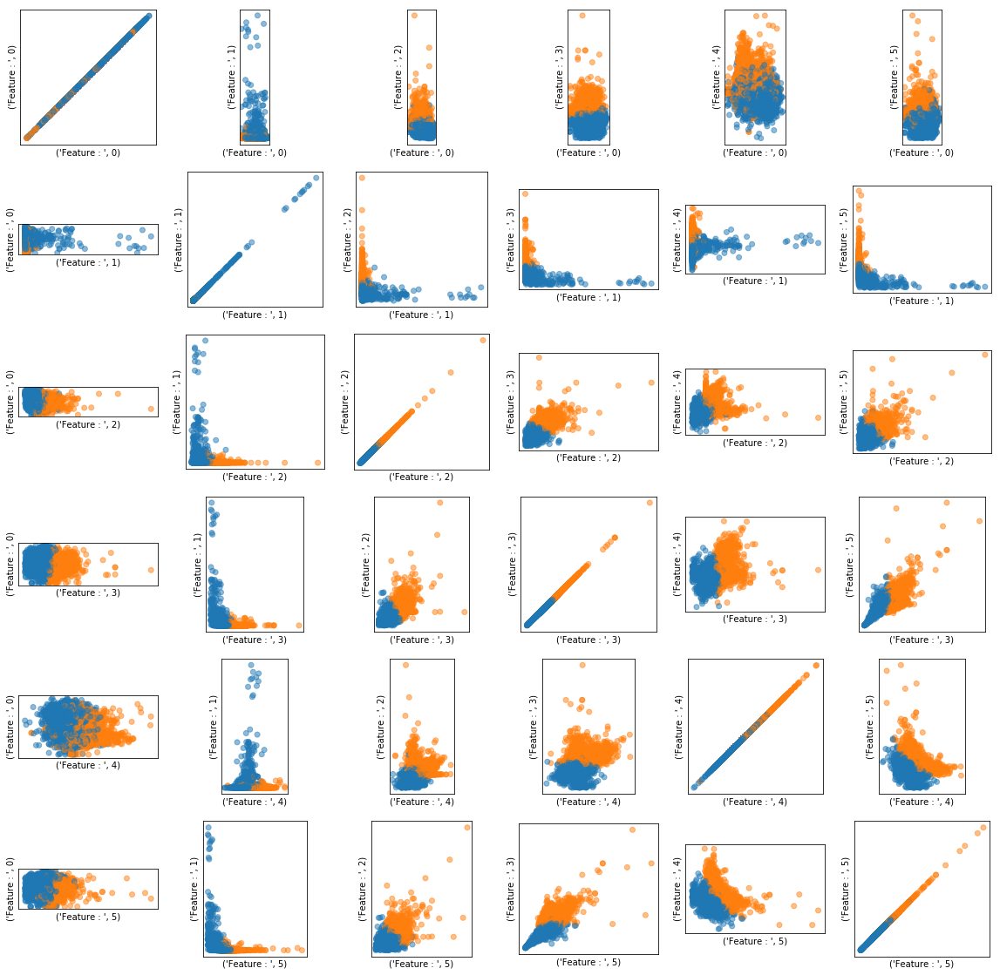

In [52]:
def scatter_tab(x, y, c, ax=None, **kwargs):
    if ax is None:
        ax = plt.gca()
    ax.scatter(x, y, c=plt.cm.Vega10(c), **kwargs)

plt.figure(figsize=(20,20))
i = 0
for col1 in ann_X_scaled.columns:
    for col2 in ann_X_scaled.columns:
        plt.subplot(6,6, i + 1)
        scatter_tab(ann_X_scaled[col1], ann_X_scaled[col2], c=km.labels_ , alpha=.5 , cmap='Accent')
        plt.gca().set_aspect("equal")
        plt.xlabel(("Feature : " ,col1))
        plt.ylabel(("Feature : " ,col2))
        plt.xticks(())
        plt.yticks(())
        i = i + 1
plt.show()

## k Means with n_clusters = 3 

In [55]:
km3 = KMeans(n_clusters=3, random_state=0)
km3.fit(ann_X_scaled)

print(km3.cluster_centers_.shape)
print(km3.labels_.shape)
print(km3.score(ann_X_scaled))

ari = adjusted_rand_score(ann_y[0], km3.labels_)
nmi = normalized_mutual_info_score(ann_y[0], km3.labels_)
ami = adjusted_mutual_info_score(ann_y[0], km3.labels_)

print("ARI: {:.2f} NMI: {:.2f} AMI: {:.2f} \n \n".format(ari, nmi, ami))


print("Cluster Size")
print(pd.Series(km3.labels_).value_counts(normalize = True)*100)

(3, 6)
(7200,)
-30075.6213259
ARI: -0.01 NMI: 0.07 AMI: 0.04 
 

Cluster Size
1    74.638889
0    24.458333
2     0.902778
dtype: float64


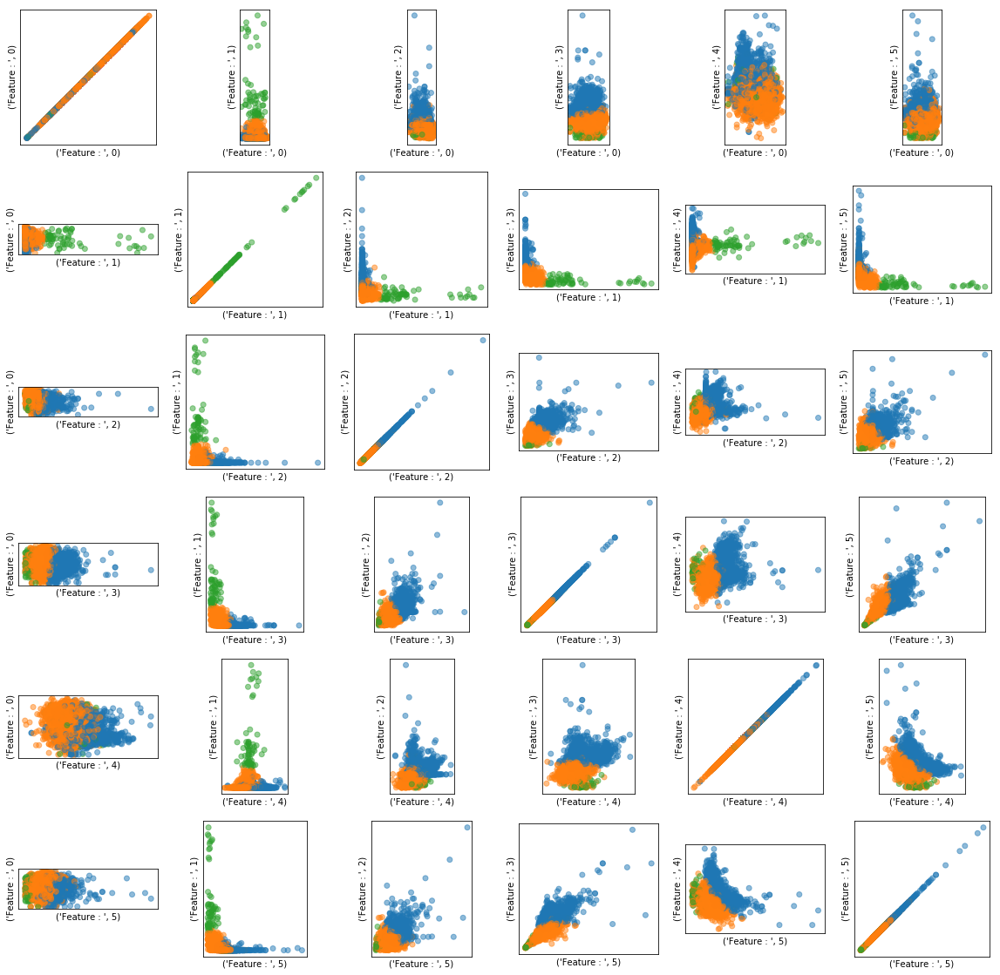

In [56]:
plt.figure(figsize=(20,20))
i = 0
for col1 in ann_X_scaled.columns:
    for col2 in ann_X_scaled.columns:
        plt.subplot(6,6, i + 1)
        scatter_tab(ann_X_scaled[col1], ann_X_scaled[col2], c=km3.labels_ , alpha=.5 , cmap='Accent')
        plt.gca().set_aspect("equal")
        plt.xlabel(("Feature : " ,col1))
        plt.ylabel(("Feature : " ,col2))
        plt.xticks(())
        plt.yticks(())
        i = i + 1
plt.show()

## k Means with n_clusters = 4

In [57]:
km4 = KMeans(n_clusters=4, random_state=0)
km4.fit(ann_X_scaled)

print(km4.cluster_centers_.shape)
print(km4.labels_.shape)
print(km4.score(ann_X_scaled))


ari = adjusted_rand_score(ann_y[0], km4.labels_)
nmi = normalized_mutual_info_score(ann_y[0], km4.labels_)
ami = adjusted_mutual_info_score(ann_y[0], km4.labels_)

print("ARI: {:.2f} NMI: {:.2f} AMI: {:.2f}\n \n".format(ari, nmi, ami))



print("Cluster Size")
print(pd.Series(km4.labels_).value_counts(normalize = True)*100)

(4, 6)
(7200,)
-25755.2933391
ARI: 0.00 NMI: 0.05 AMI: 0.02
 

Cluster Size
1    48.055556
2    35.916667
0    15.166667
3     0.861111
dtype: float64


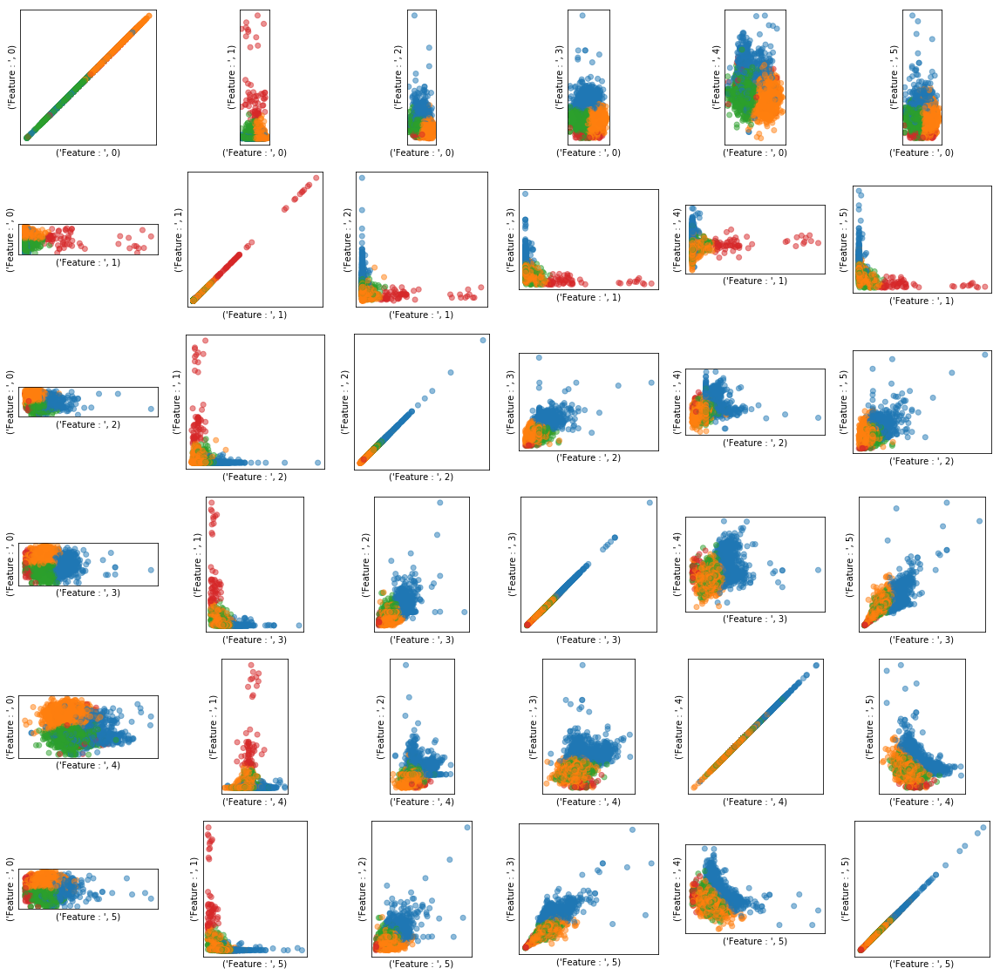

In [58]:
plt.figure(figsize=(20,20))
i = 0
for col1 in ann_X_scaled.columns:
    for col2 in ann_X_scaled.columns:
        plt.subplot(6,6, i + 1)
        scatter_tab(ann_X_scaled[col1], ann_X_scaled[col2], c=km4.labels_ , alpha=.5 , cmap='Accent')
        plt.gca().set_aspect("equal")
        plt.xlabel(("Feature : " ,col1))
        plt.ylabel(("Feature : " ,col2))
        plt.xticks(())
        plt.yticks(())
        i = i + 1
plt.show()

## k Means with n_clusters = 5

In [59]:
km5 = KMeans(n_clusters=5, random_state=0)
km5.fit(ann_X_scaled)

print(km5.cluster_centers_.shape)
print(km5.labels_.shape)
print(km5.score(ann_X_scaled))

ari = adjusted_rand_score(ann_y[0], km5.labels_)
nmi = normalized_mutual_info_score(ann_y[0], km5.labels_)
ami = adjusted_mutual_info_score(ann_y[0], km5.labels_)

print("ARI: {:.2f} NMI: {:.2f} AMI: {:.2f}\n \n".format(ari, nmi, ami))



print("Cluster Size")
print(pd.Series(km5.labels_).value_counts(normalize = True)*100)

(5, 6)
(7200,)
-22836.1289766
ARI: -0.00 NMI: 0.05 AMI: 0.02
 

Cluster Size
4    46.305556
0    34.430556
2    10.083333
3     8.319444
1     0.861111
dtype: float64


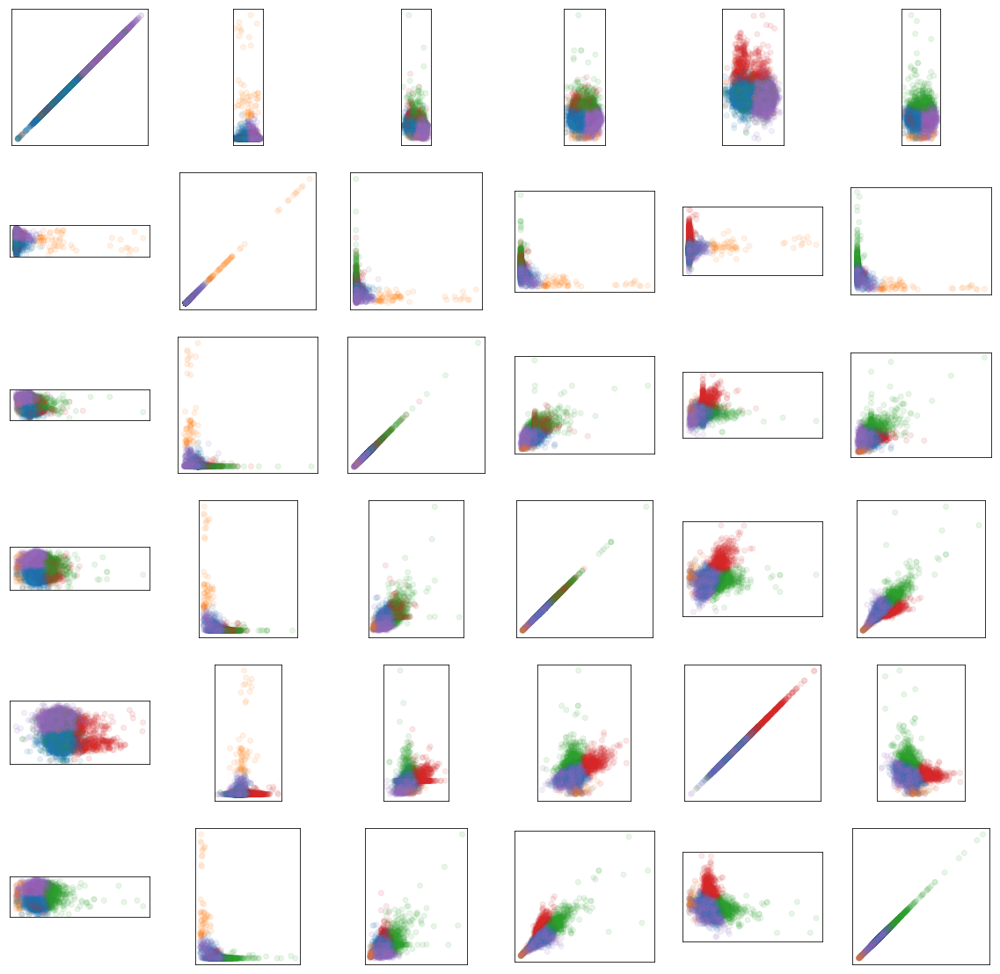

In [187]:
plt.figure(figsize=(20,20))
i = 0
for col1 in ann_X_scaled.columns:
    for col2 in ann_X_scaled.columns:
        plt.subplot(6,6, i + 1)
        scatter_tab(ann_X_scaled[col1], ann_X_scaled[col2], c=km5.labels_ , alpha=.5 , cmap='Accent')
        plt.gca().set_aspect("equal")
        plt.xlabel(("Feature : " ,col1))
        plt.ylabel(("Feature : " ,col2))
        plt.xticks(())
        plt.yticks(())
        i = i + 1
plt.show()

### As seen above we have used K-Means to cluster the dataset without using the ground truth values. We tuned the number of clusters from 2 to 5 with step size of 1. The cases with cluster size 2,3,4 have high cluster sizes (decreses with more number of clusters) with overlapping entries as can be seen in the scatter plots. The n_cluster  5 seems a better choice, in this case the clusters "3" and "1" can be used to detect outliers. 



## Agglomerative Clustering

In the following section we evaluate three types of linkage functions of aglomerative clustering using different number of clusters (3, 4, 5). 

Note: We have added the clustering performace using ground truth later, after evaluating the performance on a stand alone basis. 

In [74]:
agg1 = AgglomerativeClustering(n_clusters=2, linkage= "average")
agg1.fit(ann_X_scaled)

ari = adjusted_rand_score(ann_y[0], agg1.labels_)
nmi = normalized_mutual_info_score(ann_y[0], agg1.labels_)
ami = adjusted_mutual_info_score(ann_y[0], agg1.labels_)

print("ARI: {:.2f} NMI: {:.2f} AMI: {:.2f}\n \n".format(ari, nmi, ami))


print("Cluster Size")
print(pd.Series(agg1.labels_).value_counts(normalize = True)*100)

ARI: -0.00 NMI: 0.00 AMI: -0.00
 

Cluster Size
0    99.972222
1     0.027778
dtype: float64


### Using "average" linkage - n_clusters 3

In [60]:
agg2 = AgglomerativeClustering(n_clusters=3, linkage= "average")
agg2.fit(ann_X_scaled)

ari = adjusted_rand_score(ann_y[0], agg2.labels_)
nmi = normalized_mutual_info_score(ann_y[0], agg2.labels_)
ami = adjusted_mutual_info_score(ann_y[0], agg2.labels_)

print("ARI: {:.2f} NMI: {:.2f} AMI: {:.2f}\n \n".format(ari, nmi, ami))


print("Cluster Size")
print(pd.Series(agg2.labels_).value_counts(normalize = True)*100)

ARI: 0.03 NMI: 0.07 AMI: 0.01
 

Cluster Size
0    99.819444
2     0.152778
1     0.027778
dtype: float64


## Dendrogram


The dendrogram below shows us the two clusters clearly, marked by green and red. We need not iterate over to the blue one, as it is merging the two clusters. So we would just want to keep the two clusters. Intuitively, the smaller one is the outlier, and the bigger one is the inlier. 

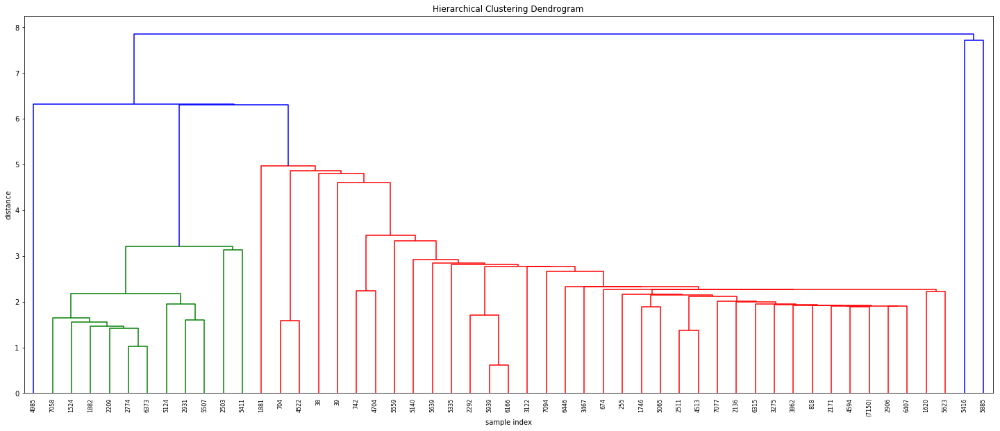

In [73]:
from scipy.cluster.hierarchy import dendrogram, linkage

Z = linkage(ann_X_scaled)
plt.figure(figsize=(25, 10))
plt.title('Hierarchical Clustering Dendrogram')
plt.xlabel('sample index')
plt.ylabel('distance')
dendrogram(
    Z,
    truncate_mode='level',
    leaf_rotation=90.,  # rotates the x axis labels
    leaf_font_size=8.,  # font size for the x axis labels
)
plt.show()

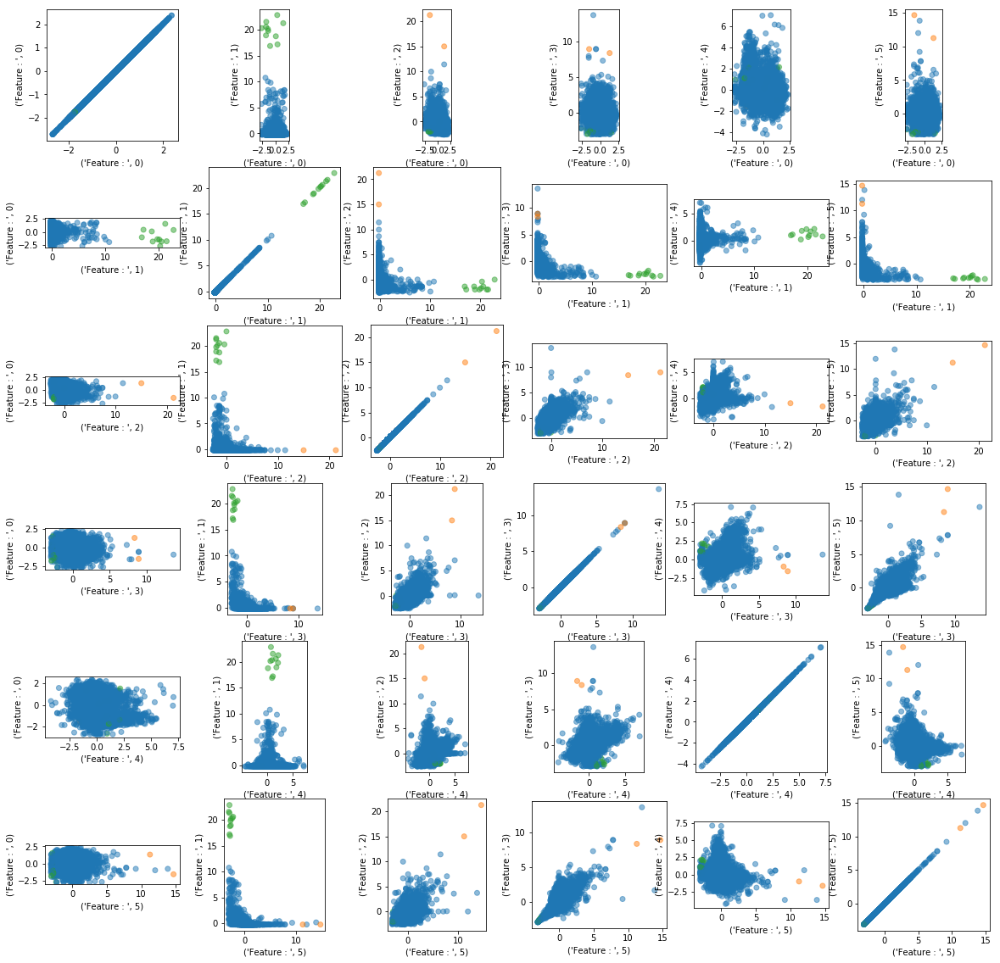

In [378]:
plt.figure(figsize=(20,20))
i = 0
for col1 in ann_X_scaled.columns:
    for col2 in ann_X_scaled.columns:
        plt.subplot(6,6, i + 1)
        plt.scatter(ann_X_scaled[col1], ann_X_scaled[col2], c=plt.cm.tab10(agg2.labels_), alpha=.5)
        plt.xlabel(("Feature : " ,col1))
        plt.ylabel(("Feature : " ,col2))
        plt.gca().set_aspect("equal")
        i = i + 1
plt.show()

### Using average linkage: n_clusters 4

In [76]:
agg4 = AgglomerativeClustering(n_clusters=4, linkage= "average")
agg4.fit(ann_X_scaled)


ari = adjusted_rand_score(ann_y[0], agg4.labels_)
nmi = normalized_mutual_info_score(ann_y[0], agg4.labels_)
ami = adjusted_mutual_info_score(ann_y[0], agg4.labels_)

print("ARI: {:.2f} NMI: {:.2f} AMI: {:.2f}\n \n".format(ari, nmi, ami))



print("Cluster Size")
print(pd.Series(agg4.labels_).value_counts(normalize = True)*100)




ARI: 0.03 NMI: 0.06 AMI: 0.01
 

Cluster Size
0    99.777778
2     0.152778
3     0.041667
1     0.027778
dtype: float64


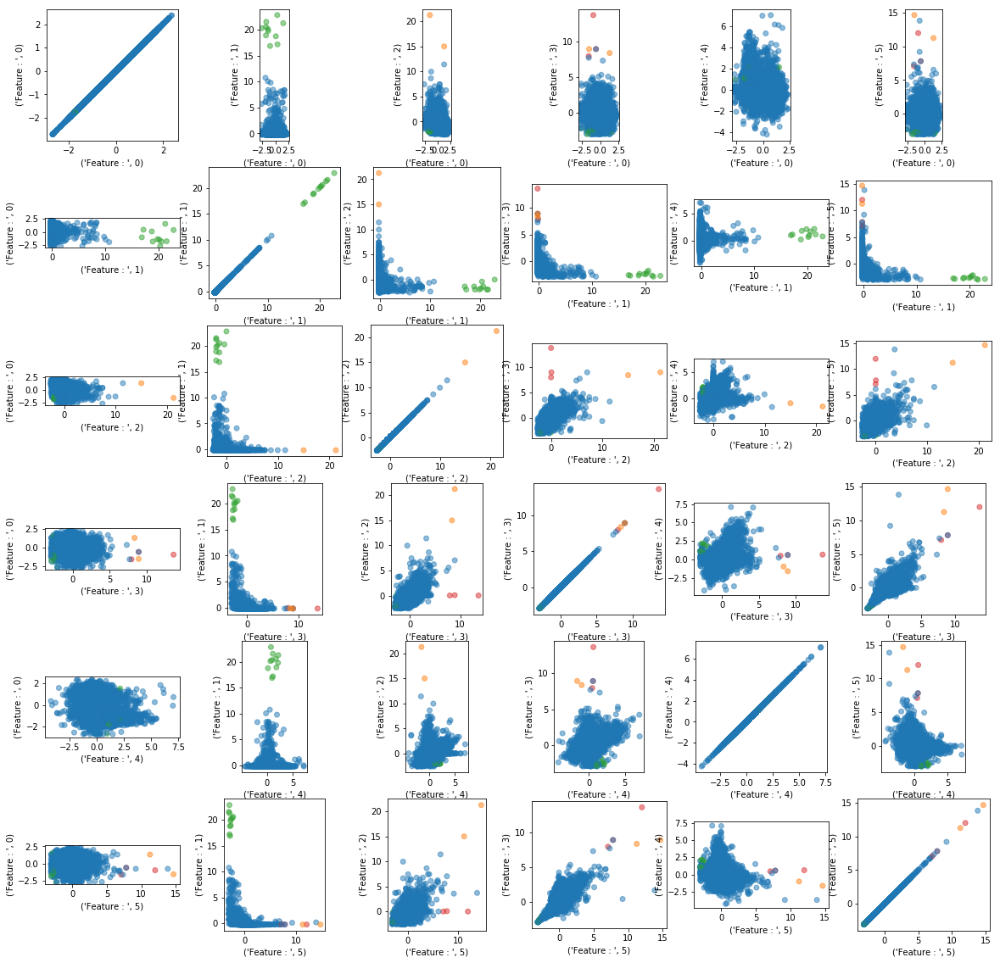

In [78]:
plt.figure(figsize=(20,20))
i = 0
for col1 in ann_X_scaled.columns:
    for col2 in ann_X_scaled.columns:
        plt.subplot(6,6, i + 1)
        plt.scatter(ann_X_scaled[col1], ann_X_scaled[col2], c=plt.cm.Vega10(agg4.labels_), alpha=.5)
        plt.xlabel(("Feature : " ,col1))
        plt.ylabel(("Feature : " ,col2))
        plt.gca().set_aspect("equal")
        i = i + 1
plt.show()

### Using "average" linkage: n_clusters 5

In [79]:
agg5 = AgglomerativeClustering(n_clusters=5, linkage= "average")
agg5.fit(ann_X_scaled)

ari = adjusted_rand_score(ann_y[0], agg5.labels_)
nmi = normalized_mutual_info_score(ann_y[0], agg5.labels_)
ami = adjusted_mutual_info_score(ann_y[0], agg5.labels_)

print("ARI: {:.2f} NMI: {:.2f} AMI: {:.2f} \n \n".format(ari, nmi, ami))


print("Cluster Size")
print(pd.Series(agg5.labels_).value_counts(normalize = True)*100)


ARI: 0.03 NMI: 0.04 AMI: 0.02 
 

Cluster Size
1    99.444444
0     0.333333
2     0.152778
3     0.041667
4     0.027778
dtype: float64


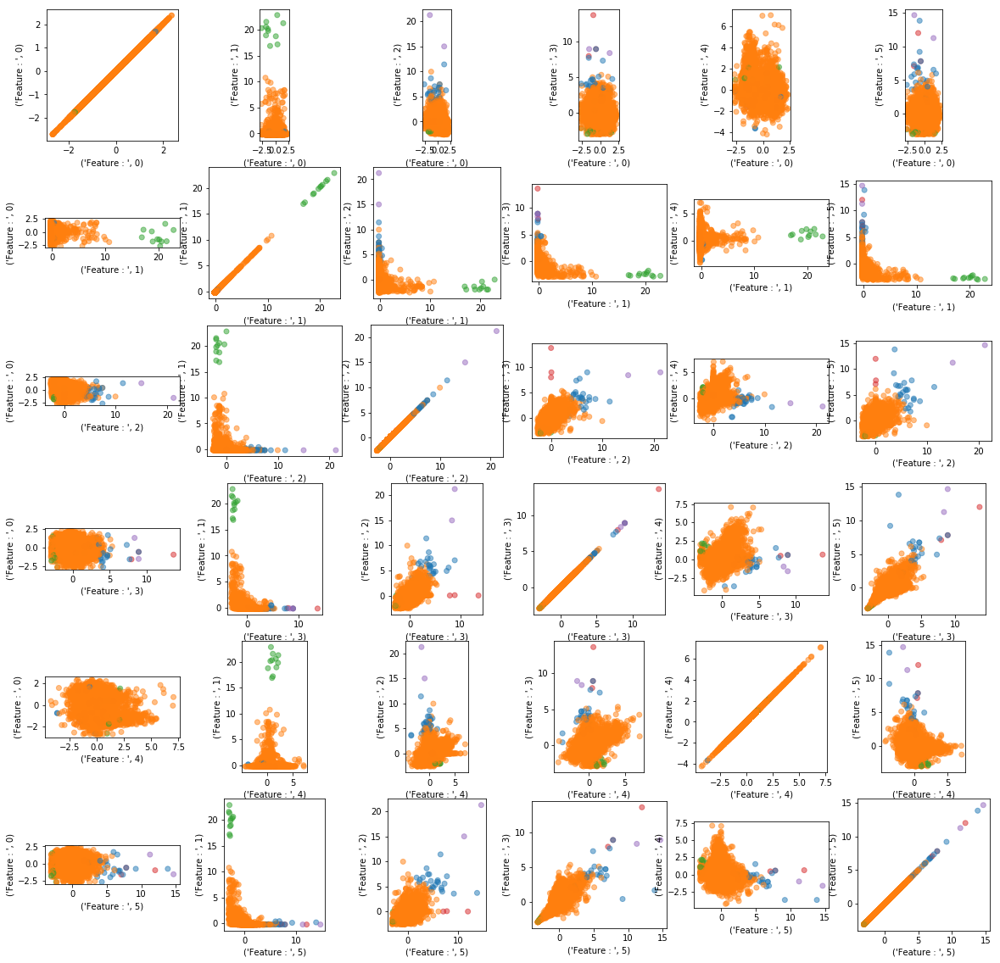

In [80]:
plt.figure(figsize=(20,20))
i = 0
for col1 in ann_X_scaled.columns:
    for col2 in ann_X_scaled.columns:
        plt.subplot(6,6, i + 1)
        plt.scatter(ann_X_scaled[col1], ann_X_scaled[col2], c=plt.cm.Vega10(agg5.labels_), alpha=.5)
        plt.xlabel(("Feature : " ,col1))
        plt.ylabel(("Feature : " ,col2))
        plt.gca().set_aspect("equal")
        i = i + 1
plt.show()

### Using "ward" linkage: n_clusters 3

In [81]:
agg2_ward = AgglomerativeClustering(n_clusters=3, linkage= "ward")
agg2_ward.fit(ann_X_scaled)

ari = adjusted_rand_score(ann_y[0], agg2_ward.labels_)
nmi = normalized_mutual_info_score(ann_y[0], agg2_ward.labels_)
ami = adjusted_mutual_info_score(ann_y[0], agg2_ward.labels_)

print("ARI: {:.2f} NMI: {:.2f} AMI: {:.2f} \n \n".format(ari, nmi, ami))


print("Cluster Size")
print(pd.Series(agg2_ward.labels_).value_counts(normalize = True)*100)


ARI: -0.05 NMI: 0.03 AMI: 0.02 
 

Cluster Size
0    88.430556
1    11.416667
2     0.152778
dtype: float64


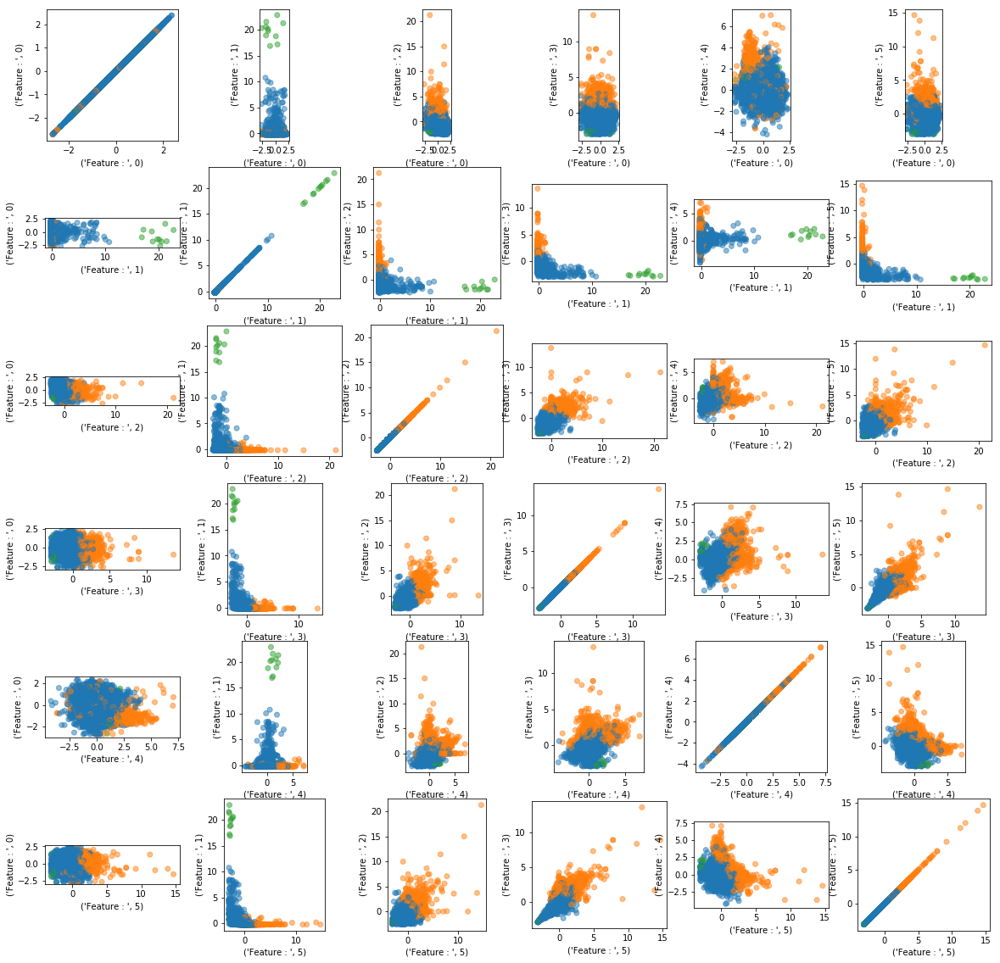

In [82]:
plt.figure(figsize=(20,20))
i = 0
for col1 in ann_X_scaled.columns:
    for col2 in ann_X_scaled.columns:
        plt.subplot(6,6, i + 1)
        plt.scatter(ann_X_scaled[col1], ann_X_scaled[col2], c=plt.cm.Vega10(agg2_ward.labels_), alpha=.5)
        plt.xlabel(("Feature : " ,col1))
        plt.ylabel(("Feature : " ,col2))
        plt.gca().set_aspect("equal")
        i = i + 1
plt.show()

### Using ward linkage: n_clusters 4

In [83]:
agg4_ward = AgglomerativeClustering(n_clusters=4, linkage= "ward")
agg4_ward.fit(ann_X_scaled)

ari = adjusted_rand_score(ann_y[0], agg4_ward.labels_)
nmi = normalized_mutual_info_score(ann_y[0], agg4_ward.labels_)
ami = adjusted_mutual_info_score(ann_y[0], agg4_ward.labels_)

print("ARI: {:.2f} NMI: {:.2f} AMI: {:.2f} \n \n".format(ari, nmi, ami))


print("Cluster Size")
print(pd.Series(agg4_ward.labels_).value_counts(normalize = True)*100)




ARI: 0.02 NMI: 0.04 AMI: 0.02 
 

Cluster Size
3    58.388889
1    30.041667
0    11.416667
2     0.152778
dtype: float64


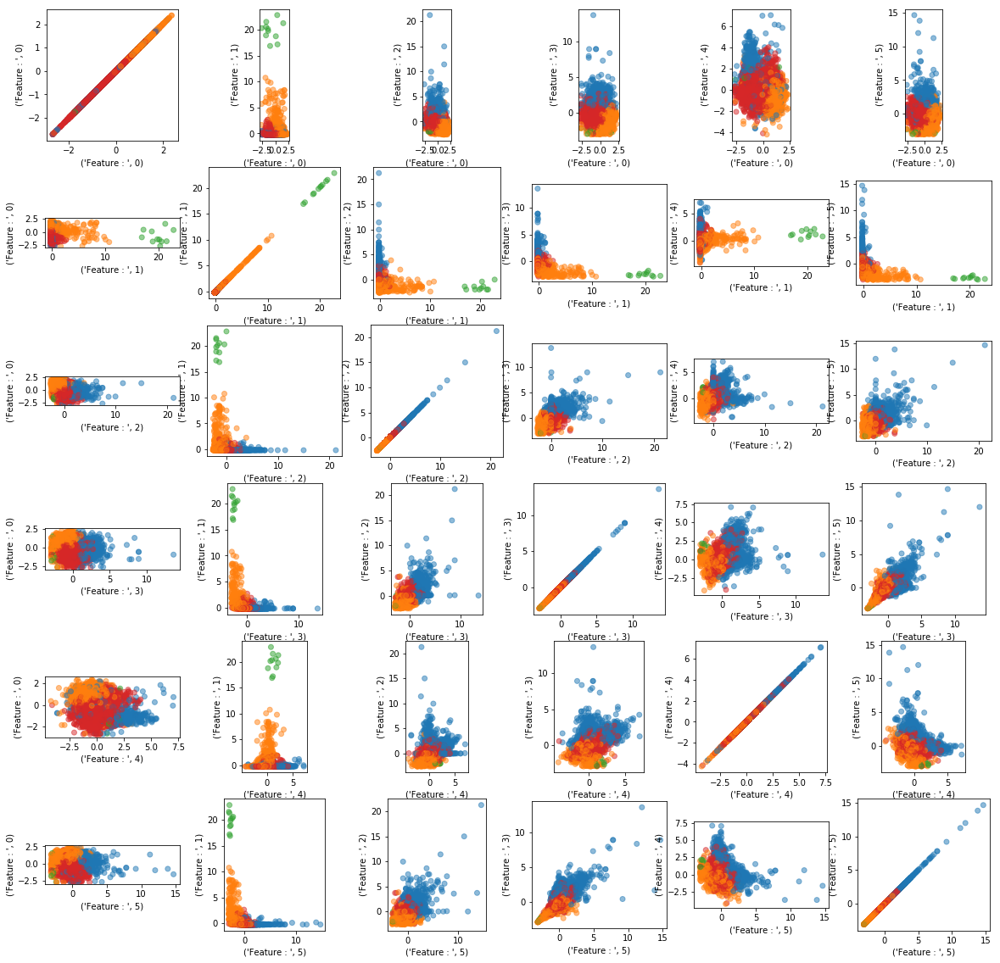

In [84]:
plt.figure(figsize=(20,20))
i = 0
for col1 in ann_X_scaled.columns:
    for col2 in ann_X_scaled.columns:
        plt.subplot(6,6, i + 1)
        plt.scatter(ann_X_scaled[col1], ann_X_scaled[col2], c=plt.cm.Vega10(agg4_ward.labels_), alpha=.5)
        plt.xlabel(("Feature : " ,col1))
        plt.ylabel(("Feature : " ,col2))
        plt.gca().set_aspect("equal")
        i = i + 1
plt.show()

### Using ward linkage: n_clusters 5

In [85]:
agg5_ward = AgglomerativeClustering(n_clusters=5, linkage= "ward")
agg5_ward.fit(ann_X_scaled)

ari = adjusted_rand_score(ann_y[0], agg5_ward.labels_)
nmi = normalized_mutual_info_score(ann_y[0], agg5_ward.labels_)
ami = adjusted_mutual_info_score(ann_y[0], agg5_ward.labels_)

print("ARI: {:.2f} NMI: {:.2f} AMI: {:.2f}\n \n".format(ari, nmi, ami))


print("Cluster Size")
print(pd.Series(agg5_ward.labels_).value_counts(normalize = True)*100)



ARI: 0.02 NMI: 0.04 AMI: 0.02
 

Cluster Size
1    58.388889
0    30.041667
3     7.347222
4     4.069444
2     0.152778
dtype: float64


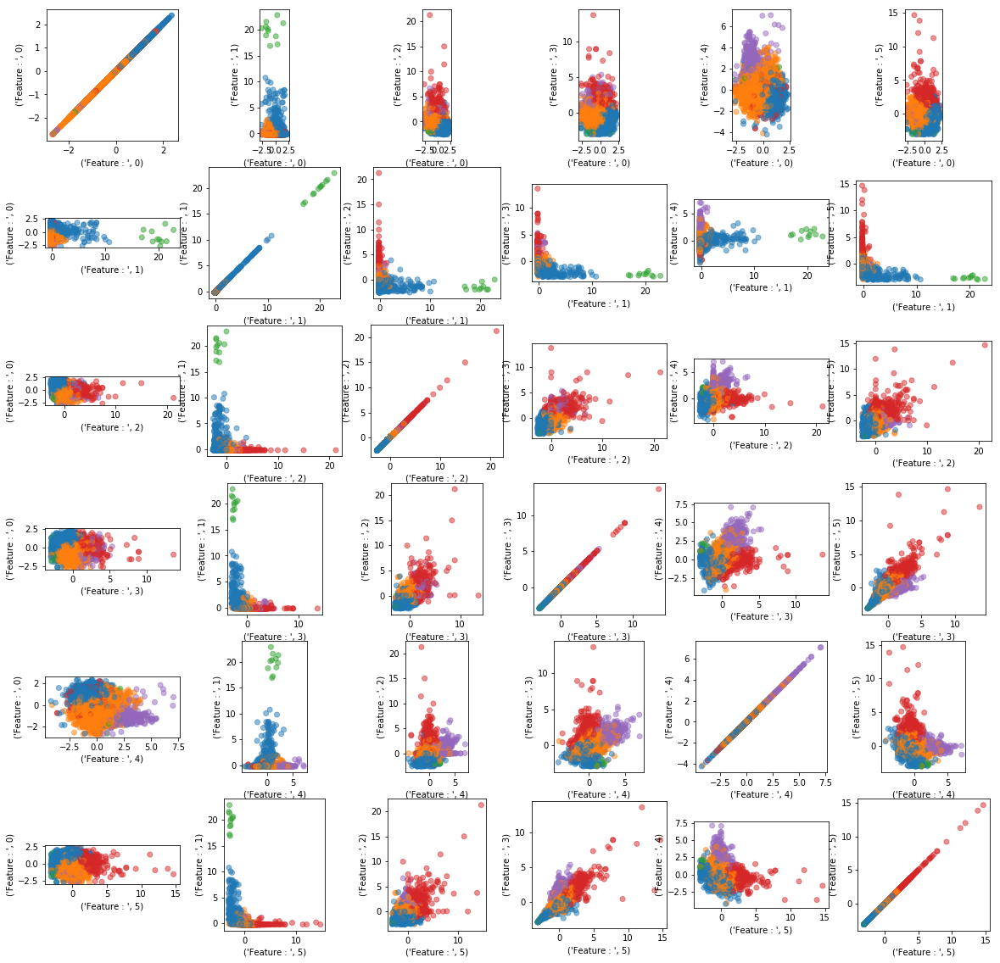

In [86]:
plt.figure(figsize=(20,20))
i = 0
for col1 in ann_X_scaled.columns:
    for col2 in ann_X_scaled.columns:
        plt.subplot(6,6, i + 1)
        plt.scatter(ann_X_scaled[col1], ann_X_scaled[col2], c=plt.cm.Vega10(agg5_ward.labels_), alpha=.5)
        plt.xlabel(("Feature : " ,col1))
        plt.ylabel(("Feature : " ,col2))
        plt.gca().set_aspect("equal")
        i = i + 1
plt.show()

### Using "complete" linkage: 3-Clusters

In [87]:
agg2_complete = AgglomerativeClustering(n_clusters=3, linkage= "complete")
agg2_complete.fit(ann_X_scaled)

ari = adjusted_rand_score(ann_y[0], agg2_complete.labels_)
nmi = normalized_mutual_info_score(ann_y[0], agg2_complete.labels_)
ami = adjusted_mutual_info_score(ann_y[0], agg2_complete.labels_)

print("ARI: {:.2f} NMI: {:.2f} AMI: {:.2f}\n \n".format( ari, nmi, ami))


print("Cluster Size")
print(pd.Series(agg2_complete.labels_).value_counts(normalize = True)*100)



ARI: 0.03 NMI: 0.05 AMI: 0.01
 

Cluster Size
1    99.708333
2     0.152778
0     0.138889
dtype: float64


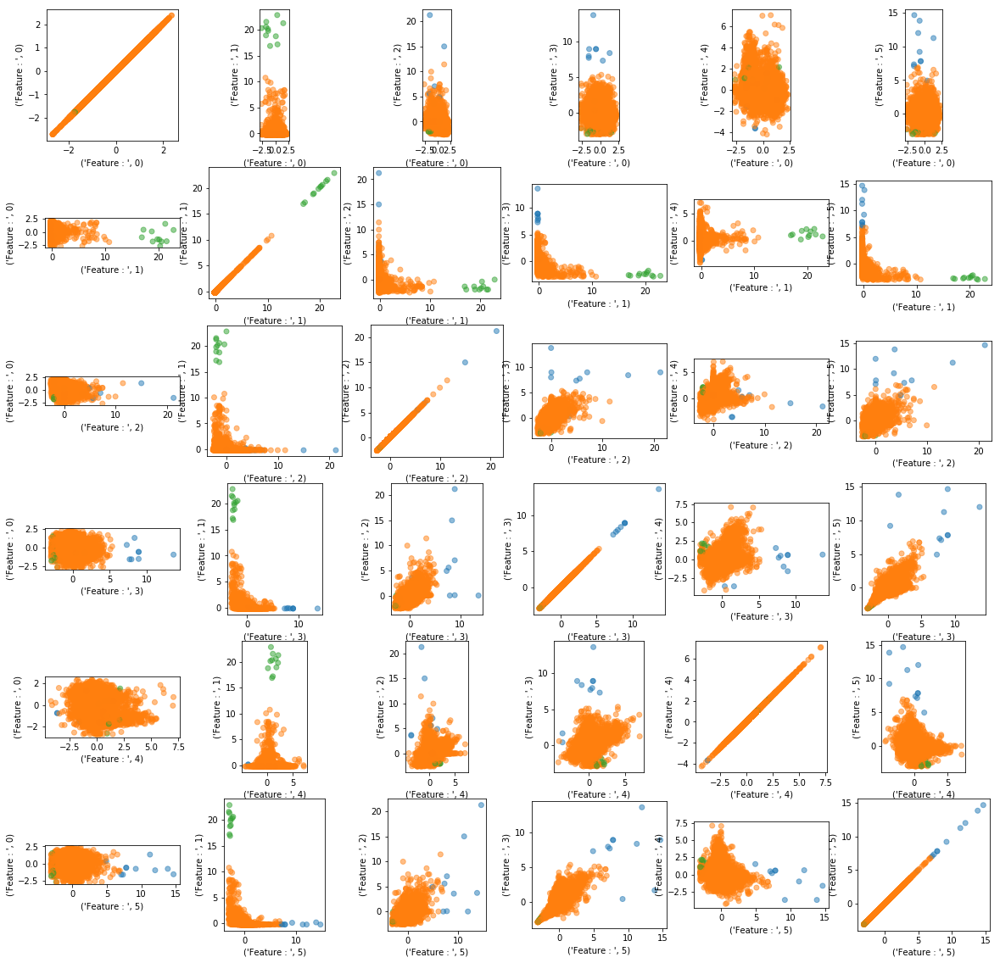

In [88]:
plt.figure(figsize=(20,20))
i = 0
for col1 in ann_X_scaled.columns:
    for col2 in ann_X_scaled.columns:
        plt.subplot(6,6, i + 1)
        plt.scatter(ann_X_scaled[col1], ann_X_scaled[col2], c=plt.cm.Vega10(agg2_complete.labels_), alpha=.5)
        plt.xlabel(("Feature : " ,col1))
        plt.ylabel(("Feature : " ,col2))
        plt.gca().set_aspect("equal")
        i = i + 1
plt.show()

### Using "complete" linkage: 4-Clusters

In [90]:
agg4_complete = AgglomerativeClustering(n_clusters=4, linkage= "complete")
agg4_complete.fit(ann_X_scaled)

ari = adjusted_rand_score(ann_y[0], agg4_complete.labels_)
nmi = normalized_mutual_info_score(ann_y[0], agg4_complete.labels_)
ami = adjusted_mutual_info_score(ann_y[0], agg4_complete.labels_)

print(" ARI: {:.2f} NMI: {:.2f} AMI: {:.2f} \n \n".format( ari, nmi, ami))



print("Cluster Size")
print(pd.Series(agg4_complete.labels_).value_counts(normalize = True)*100)




 ARI: 0.03 NMI: 0.05 AMI: 0.01 
 

Cluster Size
0    99.708333
2     0.152778
1     0.111111
3     0.027778
dtype: float64


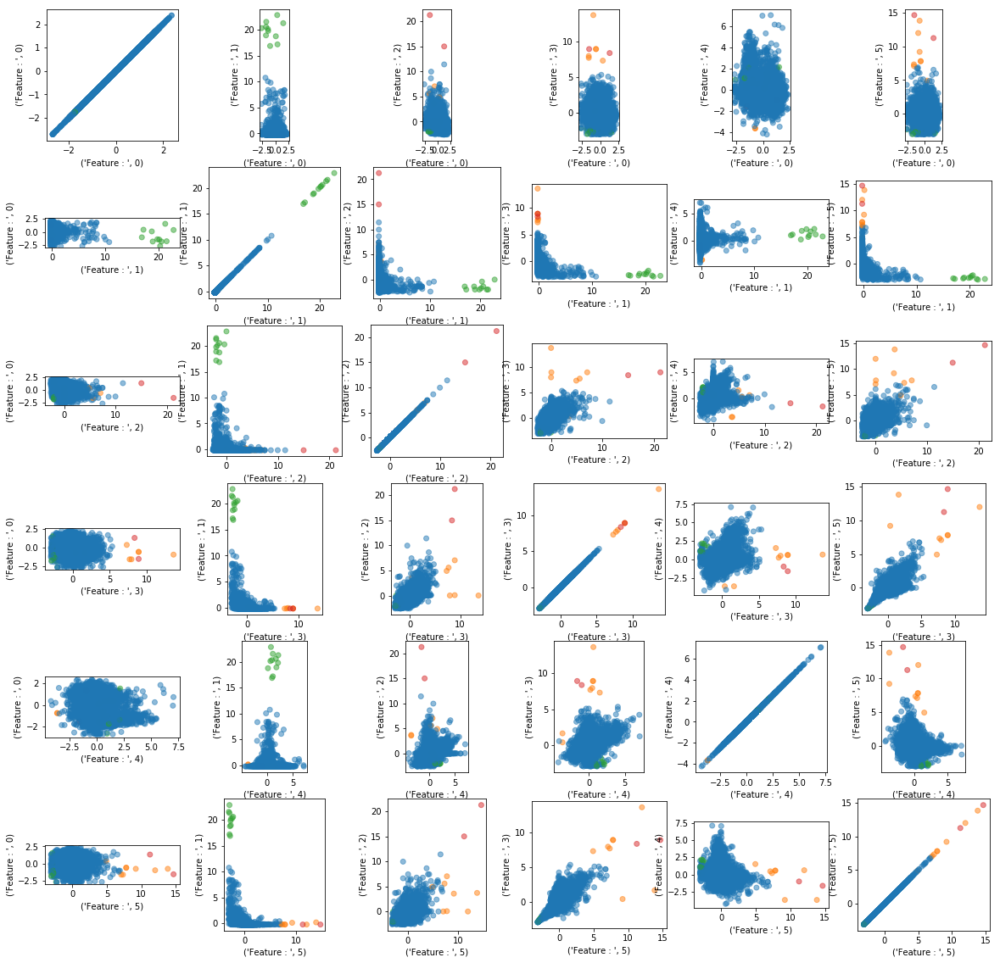

In [91]:
plt.figure(figsize=(20,20))
i = 0
for col1 in ann_X_scaled.columns:
    for col2 in ann_X_scaled.columns:
        plt.subplot(6,6, i + 1)
        plt.scatter(ann_X_scaled[col1], ann_X_scaled[col2], c=plt.cm.Vega10(agg4_complete.labels_), alpha=.5)
        plt.xlabel(("Feature : " ,col1))
        plt.ylabel(("Feature : " ,col2))
        plt.gca().set_aspect("equal")
        i = i + 1
plt.show()

### 5 Clusters with complete linkage

In [92]:
agg5_complete = AgglomerativeClustering(n_clusters=5, linkage= "complete")
agg5_complete.fit(ann_X_scaled)

ari = adjusted_rand_score(ann_y[0], agg5_complete.labels_)
nmi = normalized_mutual_info_score(ann_y[0], agg5_complete.labels_)
ami = adjusted_mutual_info_score(ann_y[0], agg5_complete.labels_)

print("ARI: {:.2f} NMI: {:.2f} AMI: {:.2f} \n \n".format( ari, nmi, ami))


print("Cluster Size")
print(pd.Series(agg5_complete.labels_).value_counts(normalize = True)*100)



ARI: 0.02 NMI: 0.03 AMI: 0.02 
 

Cluster Size
0    98.861111
4     0.847222
2     0.152778
1     0.111111
3     0.027778
dtype: float64


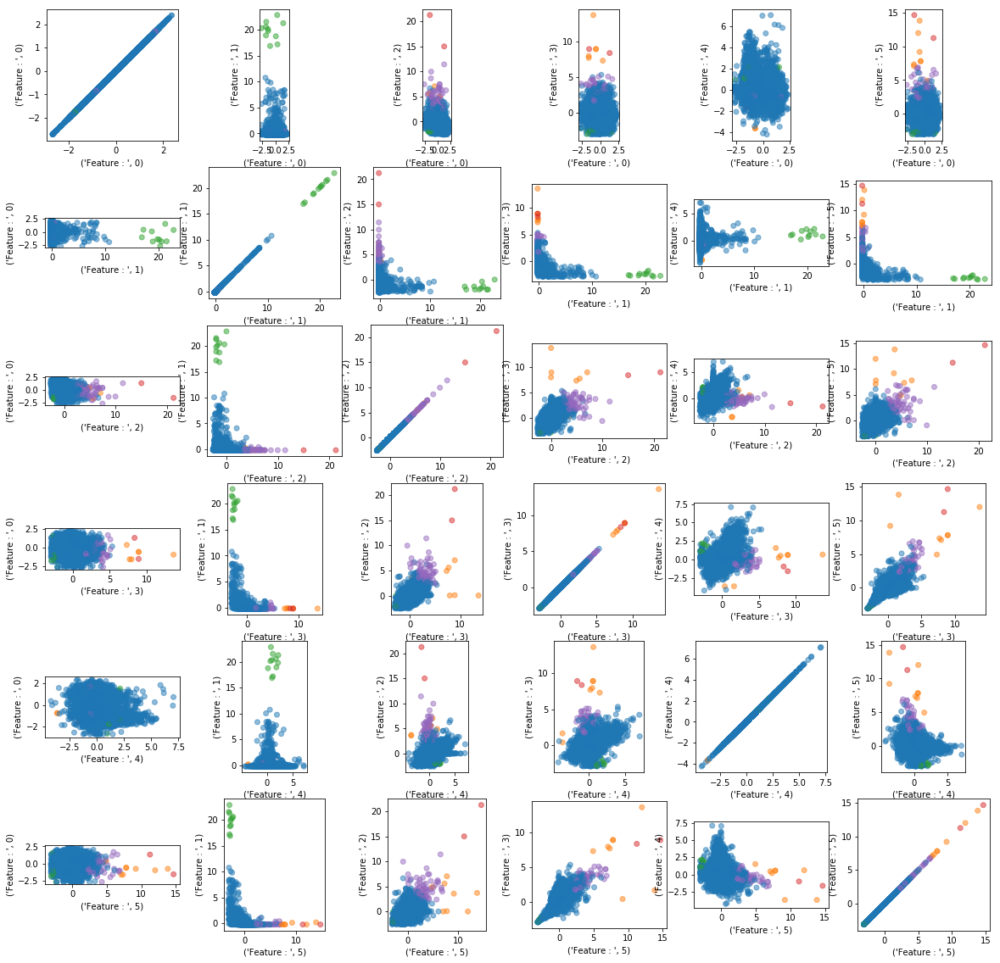

In [93]:
plt.figure(figsize=(20,20))
i = 0
for col1 in ann_X_scaled.columns:
    for col2 in ann_X_scaled.columns:
        plt.subplot(6,6, i + 1)
        plt.scatter(ann_X_scaled[col1], ann_X_scaled[col2], c=plt.cm.Vega10(agg5_complete.labels_), alpha=.5)
        plt.xlabel(("Feature : " ,col1))
        plt.ylabel(("Feature : " ,col2))
        plt.gca().set_aspect("equal")
        i = i + 1
plt.show()

### As seen above we have analysed Agglomerative clustering for n_clusters 3, 4 and 5.  We have used three types of linkage functions "ward", "complete"and "average". 

### As seen above the linkage "average" and "complete" have one big cluster (more than 99% of the data) and rest of the clusters constitute outliers. However in this case we are unable to detect a few outliers as can be seen in the graphs above. 

### Ward linkage has better distribution of cluster sizes, and with increse in the number of clusters it performs better as seen in the graphs, as when the number of clusters is 3 and 4 it still classifies a lot of near by points in different classes. 


## DBSCAN

### In this section we analze the DBSCAN algorithm for clusteri manually tune the parameters of the model eps and min_samples. First we keep a constant eps of 5 and model for min_samples 4, 10 and 30. Later we keep a constant min_samples of 5 and change the eps to 1, 5, and 7. 


### Note: We also compare the model performance with the ground truth using ARI, NMI and AMI indices, however we have added this later after looking at the model performance at stand alone basis.

min_samples: 4 eps: 5.000000  cluster: [0 0 0 ..., 0 0 0]
eps: 5.00 ARI: 0.03 NMI: 0.06 AMI: 0.01 
 

Cluster Size
 0    0.997778
 1    0.001528
-1    0.000694
dtype: float64


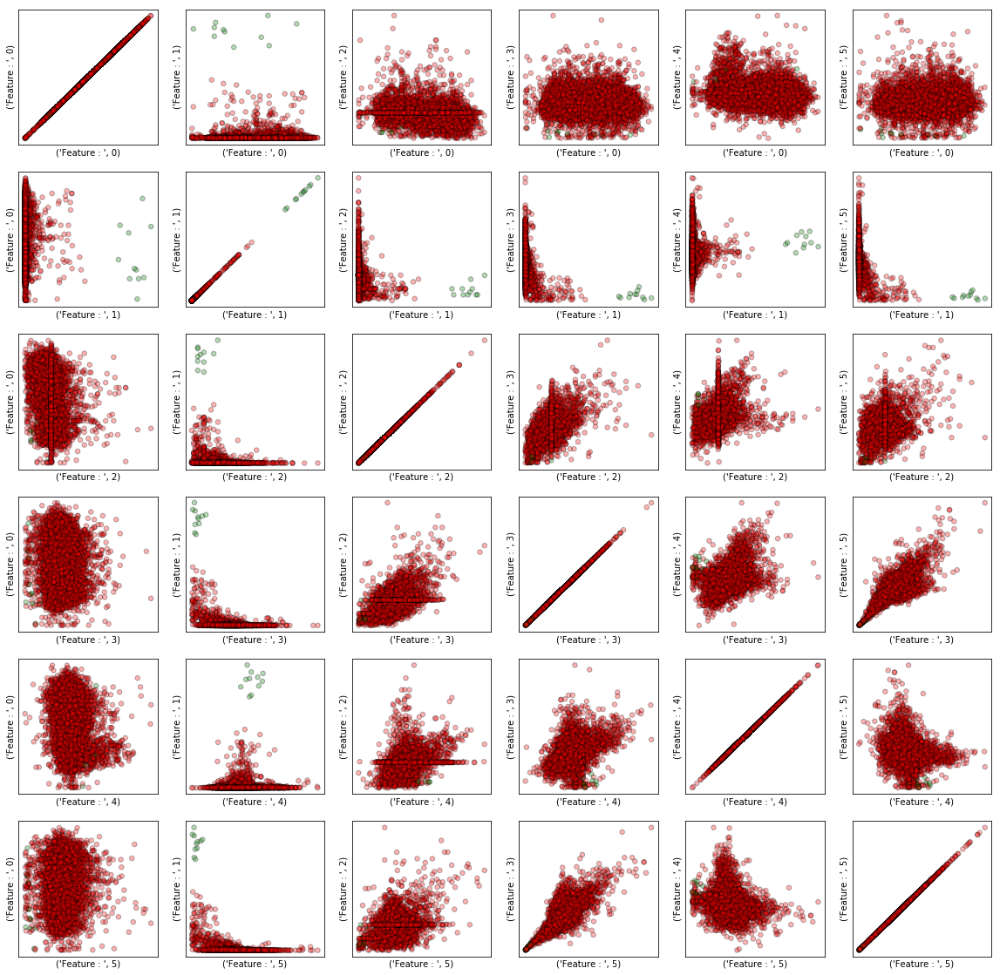

In [94]:
from sklearn.cluster import DBSCAN

min_samples = 4
eps = 5
plt.figure(figsize=(4, 5))
dbscan = DBSCAN(min_samples=min_samples, eps=eps)
colors = ['r', 'g', 'b', 'k', 'cyan']
markers = ['o', '^', 'v']

# get cluster assignments
clusters = dbscan.fit_predict(ann_X_scaled)

print("min_samples: %d eps: %f  cluster: %s"
      % (min_samples, eps, clusters))


ari = adjusted_rand_score(ann_y[0], dbscan.labels_)
nmi = normalized_mutual_info_score(ann_y[0], dbscan.labels_)
ami = adjusted_mutual_info_score(ann_y[0], dbscan.labels_)

print("eps: {:.2f} ARI: {:.2f} NMI: {:.2f} AMI: {:.2f} \n \n".format(eps, ari, nmi, ami))


print("Cluster Size")
print(pd.Series(dbscan.labels_).value_counts(normalize = True))


if np.any(clusters == -1):
    c = ['w'] + colors
    clusters = clusters + 1
else:
    c = colors
    m = markers
c = np.array(c)
#plt.scatter(ann_X_scaled[:, 0], ann_X_scaled[:, 1], c=c[clusters], s=10, edgecolor="k")
inds = dbscan.core_sample_indices_
# vizualize core samples and clusters.
i = 0
plt.figure(figsize=(20,20))
plt.title("min_samples: %d eps: %.1f"
                     % (min_samples, eps))
for col1 in ann_X_scaled.columns:
    for col2 in ann_X_scaled.columns:
        if len(inds):
            plt.subplot(6,6, i + 1)
            plt.scatter(ann_X_scaled.iloc[inds][col1], ann_X_scaled.iloc[inds][col2], c=c[clusters[inds]],
                     s=30, edgecolor="k", alpha = 0.3)
            plt.xlabel(("Feature : " ,col1))
            plt.ylabel(("Feature : " ,col2))
            plt.xticks(())
            plt.yticks(())
        i = i + 1  
plt.show()

min_samples: 10 eps: 5.000000  cluster: [0 0 0 ..., 0 0 0]
eps: 5.00 ARI: 0.03 NMI: 0.06 AMI: 0.01 
 

Cluster Size
 0    0.997778
 1    0.001528
-1    0.000694
dtype: float64


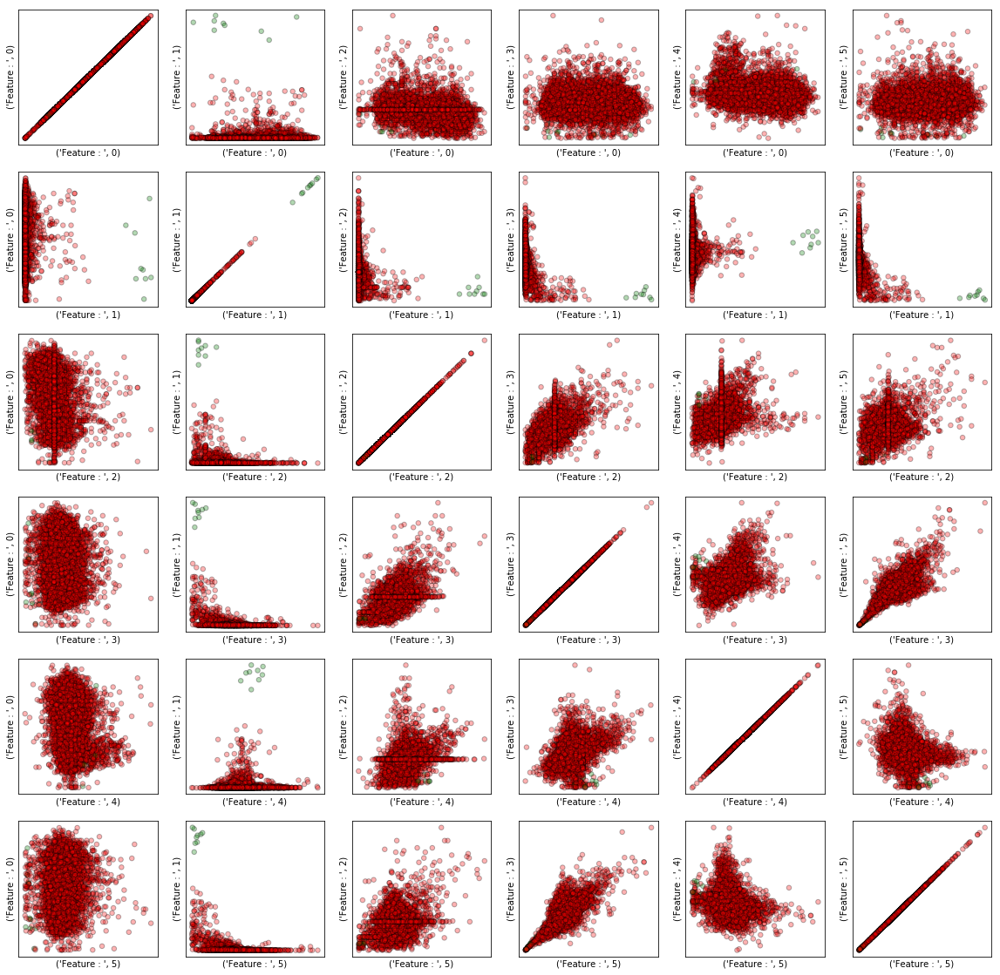

In [95]:
from sklearn.cluster import DBSCAN

min_samples = 10
eps = 5
plt.figure(figsize=(4, 5))
dbscan = DBSCAN(min_samples=min_samples, eps=eps)
colors = ['r', 'g', 'b', 'k', 'cyan']
markers = ['o', '^', 'v']

# get cluster assignments
clusters = dbscan.fit_predict(ann_X_scaled)
print("min_samples: %d eps: %f  cluster: %s"
      % (min_samples, eps, clusters))



ari = adjusted_rand_score(ann_y[0], dbscan.labels_)
nmi = normalized_mutual_info_score(ann_y[0], dbscan.labels_)
ami = adjusted_mutual_info_score(ann_y[0], dbscan.labels_)

print("eps: {:.2f} ARI: {:.2f} NMI: {:.2f} AMI: {:.2f} \n \n".format(eps, ari, nmi, ami))



print("Cluster Size")
print(pd.Series(dbscan.labels_).value_counts(normalize = True))




if np.any(clusters == -1):
    c = ['w'] + colors
    clusters = clusters + 1
else:
    c = colors
    m = markers
c = np.array(c)
#plt.scatter(ann_X_scaled[:, 0], ann_X_scaled[:, 1], c=c[clusters], s=10, edgecolor="k")
inds = dbscan.core_sample_indices_
# vizualize core samples and clusters.
i = 0
plt.figure(figsize=(20,20))
plt.title("min_samples: %d eps: %.1f"
                     % (min_samples, eps))
for col1 in ann_X_scaled.columns:
    for col2 in ann_X_scaled.columns:
        if len(inds):
            plt.subplot(6,6, i + 1)
            plt.scatter(ann_X_scaled.iloc[inds][col1], ann_X_scaled.iloc[inds][col2], c=c[clusters[inds]],
                     s=30, edgecolor="k", alpha = 0.3)
            plt.xlabel(("Feature : " ,col1))
            plt.ylabel(("Feature : " ,col2))
            plt.xticks(())
            plt.yticks(())
        i = i + 1  
plt.show()



min_samples: 30 eps: 5.000000  cluster: [0 0 0 ..., 0 0 0]
eps: 5.00 ARI: 0.03 NMI: 0.04 AMI: 0.01 
 

Cluster Size
 0    0.997639
-1    0.002361
dtype: float64


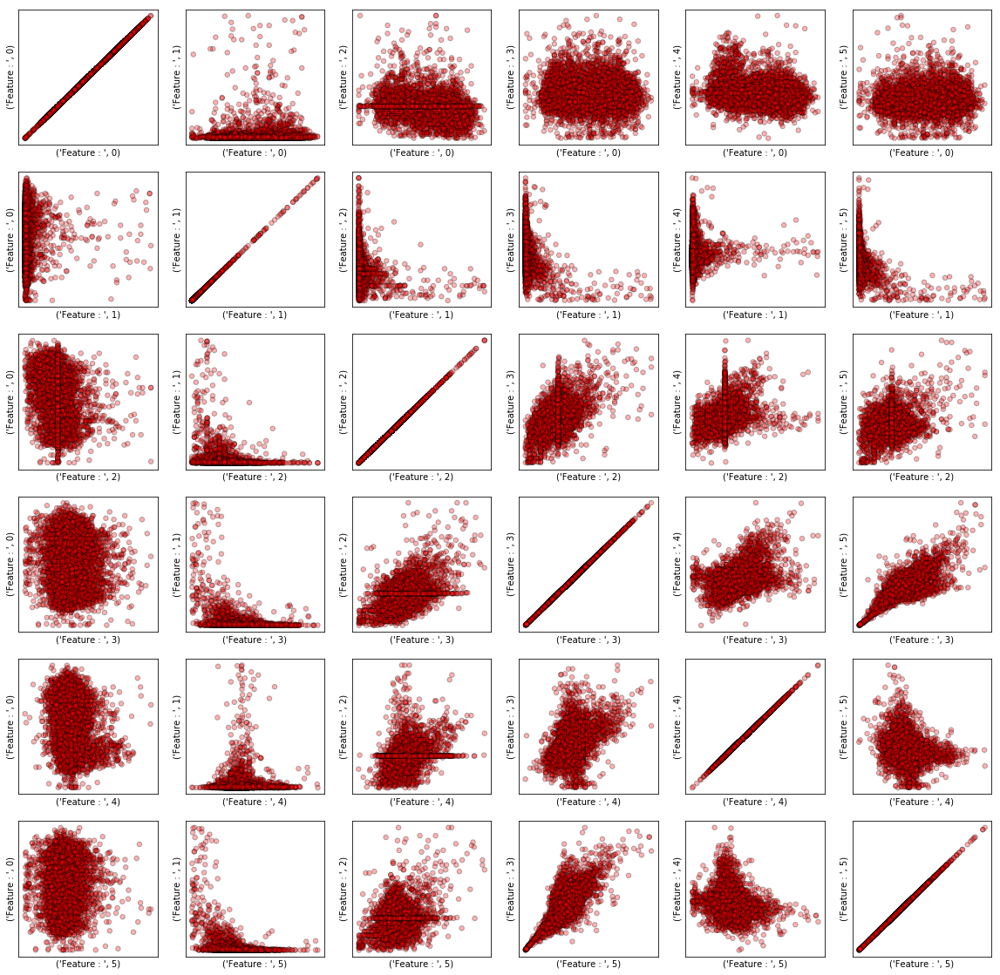

In [96]:
from sklearn.cluster import DBSCAN

min_samples = 30
eps = 5
plt.figure(figsize=(4, 5))
dbscan = DBSCAN(min_samples=min_samples, eps=eps)
colors = ['r', 'g', 'b', 'k', 'cyan']
markers = ['o', '^', 'v']

# get cluster assignments
clusters = dbscan.fit_predict(ann_X_scaled)
print("min_samples: %d eps: %f  cluster: %s"
      % (min_samples, eps, clusters))




ari = adjusted_rand_score(ann_y[0], dbscan.labels_)
nmi = normalized_mutual_info_score(ann_y[0], dbscan.labels_)
ami = adjusted_mutual_info_score(ann_y[0], dbscan.labels_)

print("eps: {:.2f} ARI: {:.2f} NMI: {:.2f} AMI: {:.2f} \n \n".format(eps, ari, nmi, ami))



print("Cluster Size")
print(pd.Series(dbscan.labels_).value_counts(normalize = True))





if np.any(clusters == -1):
    c = ['w'] + colors
    clusters = clusters + 1
else:
    c = colors
    m = markers
c = np.array(c)
#plt.scatter(ann_X_scaled[:, 0], ann_X_scaled[:, 1], c=c[clusters], s=10, edgecolor="k")
inds = dbscan.core_sample_indices_
# vizualize core samples and clusters.
i = 0
plt.figure(figsize=(20,20))
plt.title("min_samples: %d eps: %.1f"
                     % (min_samples, eps))
for col1 in ann_X_scaled.columns:
    for col2 in ann_X_scaled.columns:
        if len(inds):
            plt.subplot(6,6, i + 1)
            plt.scatter(ann_X_scaled.iloc[inds][col1], ann_X_scaled.iloc[inds][col2], c=c[clusters[inds]],
                     s=30, edgecolor="k", alpha = 0.3)
            plt.xlabel(("Feature : " ,col1))
            plt.ylabel(("Feature : " ,col2))
            plt.xticks(())
            plt.yticks(())
        i = i + 1  
plt.show()

min_samples: 5 eps: 1.000000  cluster: [0 0 0 ..., 0 0 0]
eps: 1.00 ARI: 0.17 NMI: 0.06 AMI: 0.05
 

Cluster Size
 0    96.000000
-1     3.847222
 2     0.097222
 1     0.055556
dtype: float64


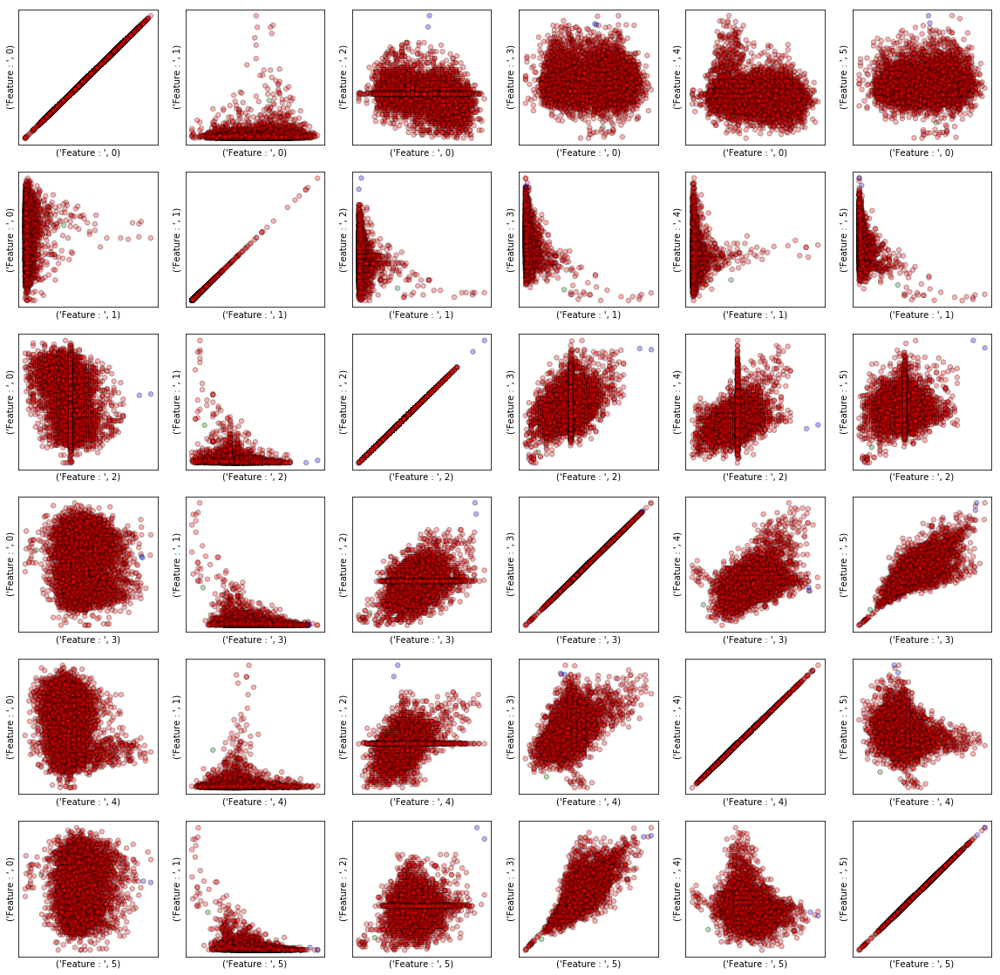

In [97]:
from sklearn.cluster import DBSCAN

min_samples = 5
eps = 1
plt.figure(figsize=(4, 5))
dbscan = DBSCAN(min_samples=min_samples, eps=eps)
colors = ['r', 'g', 'b', 'k', 'cyan']
markers = ['o', '^', 'v']

# get cluster assignments
clusters = dbscan.fit_predict(ann_X_scaled)
print("min_samples: %d eps: %f  cluster: %s"
      % (min_samples, eps, clusters))


ari = adjusted_rand_score(ann_y[0], dbscan.labels_)
nmi = normalized_mutual_info_score(ann_y[0], dbscan.labels_)
ami = adjusted_mutual_info_score(ann_y[0], dbscan.labels_)

print("eps: {:.2f} ARI: {:.2f} NMI: {:.2f} AMI: {:.2f}\n \n".format(eps, ari, nmi, ami))


print("Cluster Size")
print(pd.Series(dbscan.labels_).value_counts(normalize = True)*100)


if np.any(clusters == -1):
    c = ['w'] + colors
    clusters = clusters + 1
else:
    c = colors
    m = markers
c = np.array(c)
#plt.scatter(ann_X_scaled[:, 0], ann_X_scaled[:, 1], c=c[clusters], s=10, edgecolor="k")
inds = dbscan.core_sample_indices_
# vizualize core samples and clusters.
i = 0
plt.figure(figsize=(20,20))
plt.title("min_samples: %d eps: %.1f"
                     % (min_samples, eps))
for col1 in ann_X_scaled.columns:
    for col2 in ann_X_scaled.columns:
        if len(inds):
            plt.subplot(6,6, i + 1)
            plt.scatter(ann_X_scaled.iloc[inds][col1], ann_X_scaled.iloc[inds][col2], c=c[clusters[inds]],
                     s=30, edgecolor="k", alpha = 0.3)
            plt.xlabel(("Feature : " ,col1))
            plt.ylabel(("Feature : " ,col2))
            plt.xticks(())
            plt.yticks(())
        i = i + 1  
plt.show()

min_samples: 4 eps: 7.000000  cluster: [0 0 0 ..., 0 0 0]
eps: 7.00 ARI: -0.00 NMI: 0.00 AMI: -0.00 
 

Cluster Size
 0    99.972222
-1     0.027778
dtype: float64


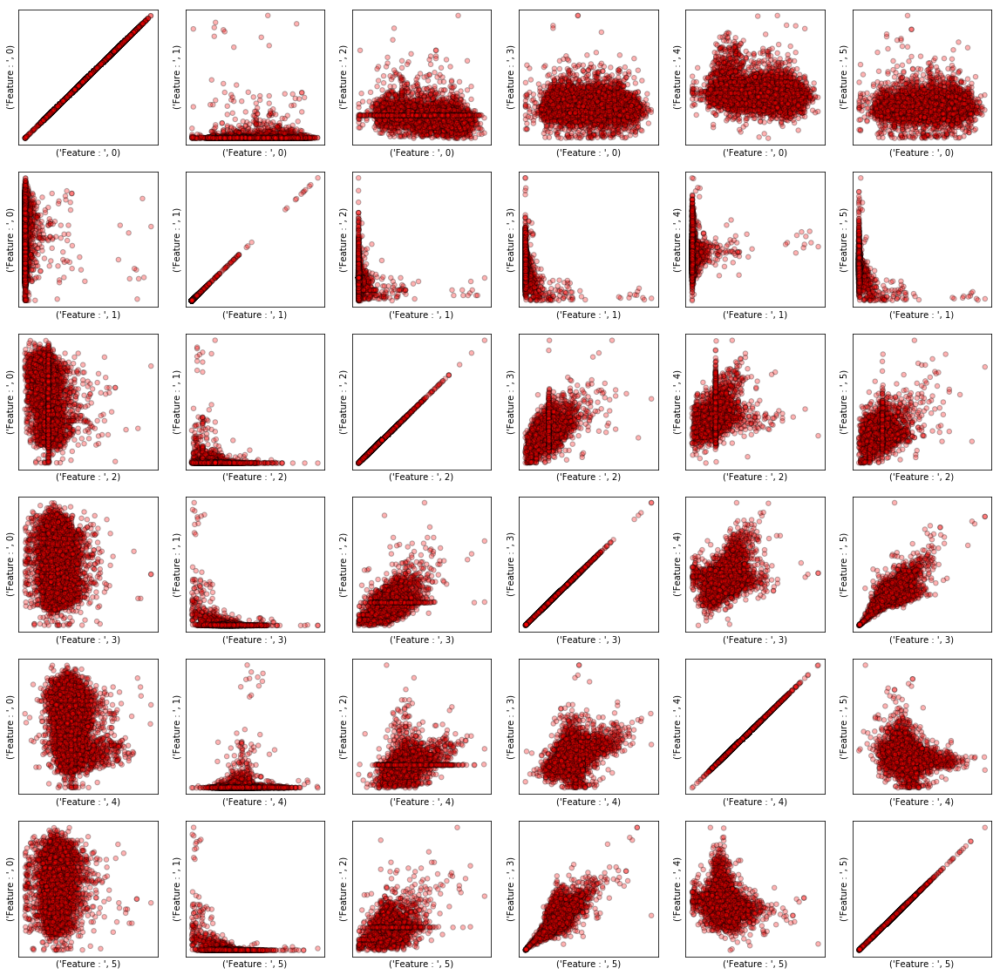

In [98]:
from sklearn.cluster import DBSCAN

min_samples = 4
eps = 7
plt.figure(figsize=(4, 5))
dbscan = DBSCAN(min_samples=min_samples, eps=eps)
colors = ['r', 'g', 'b', 'k', 'cyan']
markers = ['o', '^', 'v']

# get cluster assignments
clusters = dbscan.fit_predict(ann_X_scaled)
print("min_samples: %d eps: %f  cluster: %s"
      % (min_samples, eps, clusters))



ari = adjusted_rand_score(ann_y[0], dbscan.labels_)
nmi = normalized_mutual_info_score(ann_y[0], dbscan.labels_)
ami = adjusted_mutual_info_score(ann_y[0], dbscan.labels_)

print("eps: {:.2f} ARI: {:.2f} NMI: {:.2f} AMI: {:.2f} \n \n".format(eps, ari, nmi, ami))


print("Cluster Size")
print(pd.Series(dbscan.labels_).value_counts(normalize = True)*100)




if np.any(clusters == -1):
    c = ['w'] + colors
    clusters = clusters + 1
else:
    c = colors
    m = markers
c = np.array(c)
#plt.scatter(ann_X_scaled[:, 0], ann_X_scaled[:, 1], c=c[clusters], s=10, edgecolor="k")
inds = dbscan.core_sample_indices_
# vizualize core samples and clusters.
i = 0
plt.figure(figsize=(20,20))
plt.title("min_samples: %d eps: %.1f"
                     % (min_samples, eps))
for col1 in ann_X_scaled.columns:
    for col2 in ann_X_scaled.columns:
        if len(inds):
            plt.subplot(6,6, i + 1)
            plt.scatter(ann_X_scaled.iloc[inds][col1], ann_X_scaled.iloc[inds][col2], c=c[clusters[inds]],
                     s=30, edgecolor="k", alpha = 0.3)
            plt.xlabel(("Feature : " ,col1))
            plt.ylabel(("Feature : " ,col2))
            plt.xticks(())
            plt.yticks(())
        i = i + 1  
plt.show()

### In the above graphs we have tuned the parameters of the DBSCAN model manually, however in all of the cases the algorithm fails to detect a large portion of outliers. 

## Task 2.2  Variation of ARI, AMI and NMI with cluster size
### Here, we vary cluster size from 0 to 30 and using the ground truth values given, try to tune the number of clusters for the K means and agglomerative clustering algorithms seen above. 

### For DBSCAN algorithm we tune the eps and min samples parameter

### For K-Mean

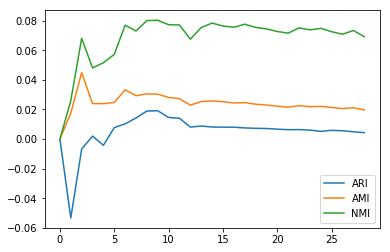

In [99]:
aris, nmis, amis = [], [], []
for i in range(1, 30):
    km = KMeans(n_clusters=i).fit(ann_X_scaled)
    ari = adjusted_rand_score(ann_y[0], km.labels_)
    nmi = normalized_mutual_info_score(ann_y[0], km.labels_)
    ami = adjusted_mutual_info_score(ann_y[0], km.labels_)
    aris.append(ari)
    nmis.append(nmi)
    amis.append(ami)
plt.plot(aris, label="ARI")
plt.plot(amis, label="AMI")
plt.plot(nmis, label="NMI")
plt.legend()
plt.show()

### For Agglomorative clustering

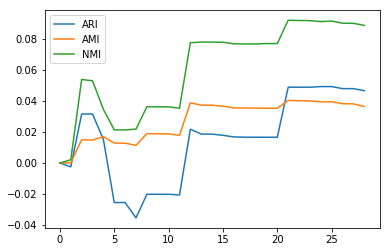

In [100]:
aris, nmis, amis = [], [], []
for i in range(1, 30):
    km = AgglomerativeClustering(n_clusters=i,linkage= "complete").fit(ann_X_scaled)
    ari = adjusted_rand_score(ann_y[0], km.labels_)
    nmi = normalized_mutual_info_score(ann_y[0], km.labels_)
    ami = adjusted_mutual_info_score(ann_y[0], km.labels_)
    aris.append(ari)
    nmis.append(nmi)
    amis.append(ami)
plt.plot(aris, label="ARI")
plt.plot(amis, label="AMI")
plt.plot(nmis, label="NMI")
plt.legend()
plt.show()

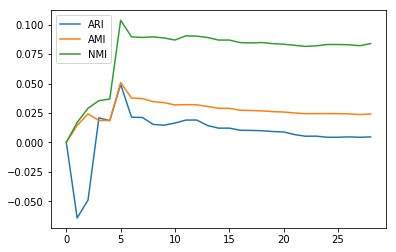

In [101]:
aris, nmis, amis = [], [], []
for i in range(1, 30):
    km = AgglomerativeClustering(n_clusters=i,linkage= "ward").fit(ann_X_scaled)
    ari = adjusted_rand_score(ann_y[0], km.labels_)
    nmi = normalized_mutual_info_score(ann_y[0], km.labels_)
    ami = adjusted_mutual_info_score(ann_y[0], km.labels_)
    aris.append(ari)
    nmis.append(nmi)
    amis.append(ami)
plt.plot(aris, label="ARI")
plt.plot(amis, label="AMI")
plt.plot(nmis, label="NMI")
plt.legend()
plt.show()

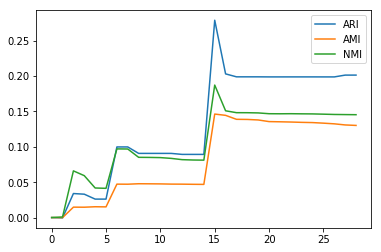

In [102]:
aris, nmis, amis = [], [], []
for i in range(1, 30):
    km = AgglomerativeClustering(n_clusters=i,linkage= "average").fit(ann_X_scaled)
    ari = adjusted_rand_score(ann_y[0], km.labels_)
    nmi = normalized_mutual_info_score(ann_y[0], km.labels_)
    ami = adjusted_mutual_info_score(ann_y[0], km.labels_)
    aris.append(ari)
    nmis.append(nmi)
    amis.append(ami)
plt.plot(aris, label="ARI")
plt.plot(amis, label="AMI")
plt.plot(nmis, label="NMI")
plt.legend()
plt.show()

### For DBSCAN

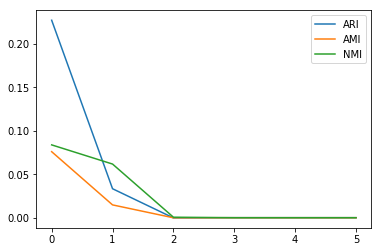

In [103]:
aris, nmis, amis = [], [], []
for i in range(1, 30, 5):
    km = DBSCAN(eps= i, min_samples= 10).fit(ann_X_scaled)
    ari = adjusted_rand_score(ann_y[0], km.labels_)
    nmi = normalized_mutual_info_score(ann_y[0], km.labels_)
    ami = adjusted_mutual_info_score(ann_y[0], km.labels_)
    aris.append(ari)
    nmis.append(nmi)
    amis.append(ami)
plt.plot(aris, label="ARI")
plt.plot(amis, label="AMI")
plt.plot(nmis, label="NMI")
plt.legend()
plt.show()

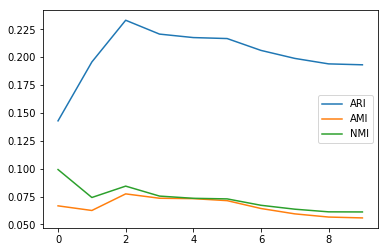

In [104]:
aris, nmis, amis = [], [], []
for i in range(1, 50, 5):
    km = DBSCAN(eps= 1, min_samples= i).fit(ann_X_scaled)
    ari = adjusted_rand_score(ann_y[0], km.labels_)
    nmi = normalized_mutual_info_score(ann_y[0], km.labels_)
    ami = adjusted_mutual_info_score(ann_y[0], km.labels_)
    aris.append(ari)
    nmis.append(nmi)
    amis.append(ami)
plt.plot(aris, label="ARI")
plt.plot(amis, label="AMI")
plt.plot(nmis, label="NMI")
plt.legend()
plt.show()

### In the above cases we use the values of ARI, AMI and NMI to tune the parameters of k-Means, DBSACN and Agglomerative clustering algorithms. 

### In case of k-Means algorithm we see that number of clusters = 6 is the optimal value. 

### In case of Agglomorative clustering, for average and complete linkages higher number of cluster (about 12) show better performance indices, while for ward linkage the number of clusters around 5 seems the best value. In this case, as seen at a stand alone basis too, ward linkage seems to be a better choice for this problem. 

### In case of DBSCAN algorithm, lower values of eps (around 0-1)and min_samples(around 2) seem to give better results. 


### SEMANTIC INTERPRETATION:
The clustering algorithms as seen in the pair wise feature scatter plots seem to be clustering the outliers in one or two separate clusters in most cases. However, K-Means and agglomorative clustering the inliers are also split into separate clusters which makes little sense. This problem is not faced in the DBSCAN approach. 

## Task 3: Outlier  detection

### 3.1 In this section we work with 3 techniques used for outlier detection, Elliptical envelope, One class SVM and Isolation Forest. We go ahead and compare their performances with and without using truth values.

#### Using Elliptical Envelope

Cluster Size 

 1    93.0
-1     7.0
dtype: float64


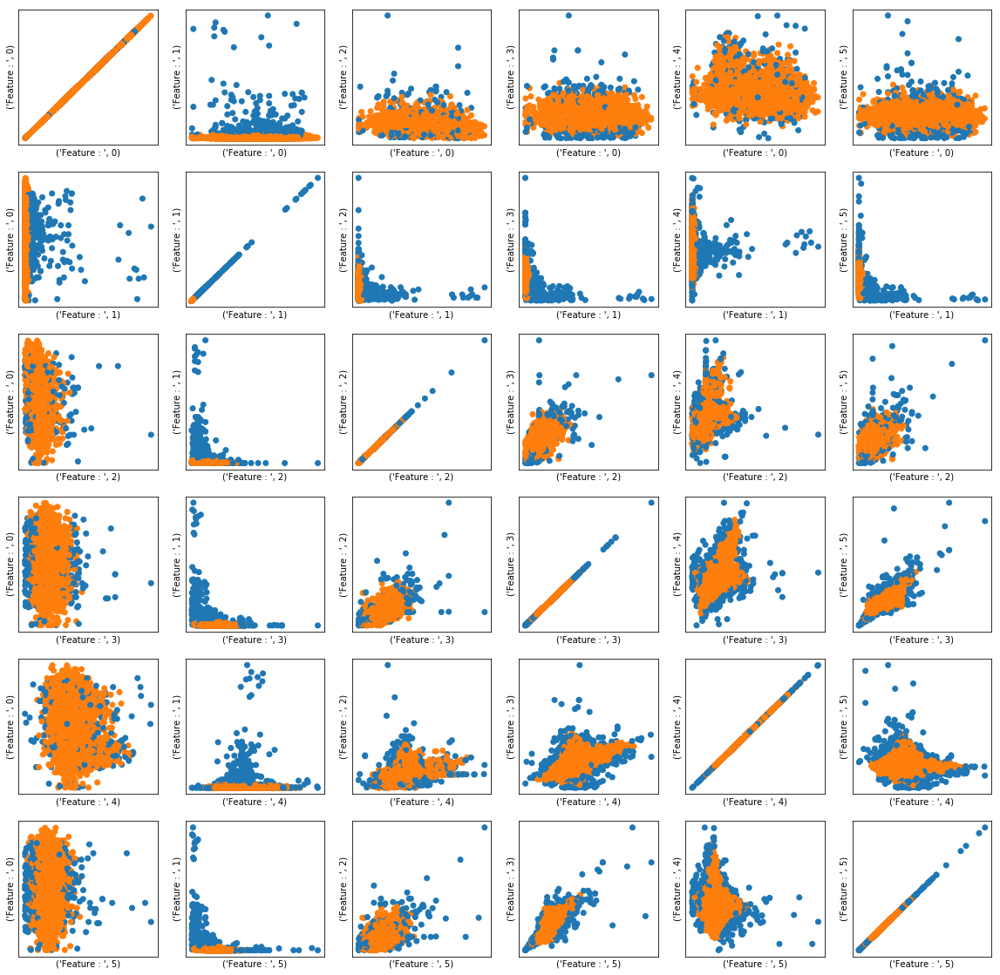

In [105]:
from sklearn.covariance import EllipticEnvelope
ee = EllipticEnvelope(contamination=.07).fit(ann_X_scaled)
pred = ee.predict(ann_X_scaled)

print("Cluster Size \n")
print(pd.Series(pred).value_counts(normalize = True)*100)


i = 0
plt.figure(figsize=(20,20))
for col1 in ann_X_scaled.columns:
    for col2 in ann_X_scaled.columns:
        if len(inds):
            plt.subplot(6,6, i + 1)
            plt.scatter(ann_X_scaled[col1], ann_X_scaled[col2], c=plt.cm.Vega10(pred))
            plt.xlabel(("Feature : " ,col1))
            plt.ylabel(("Feature : " ,col2))
            plt.xticks(())
            plt.yticks(())
        i = i + 1  
plt.show()

#### One Class SVM

Cluster Size 

 1    93.055556
-1     6.944444
dtype: float64


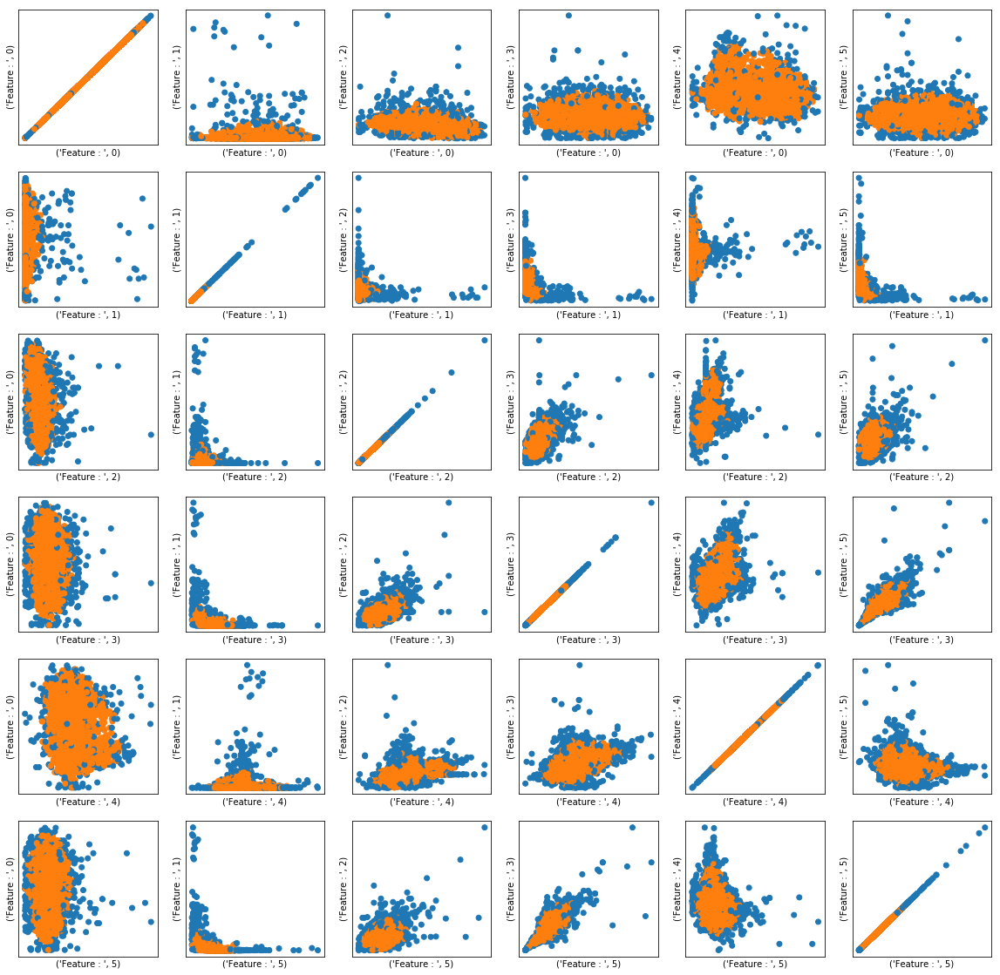

In [106]:
oneclass = OneClassSVM(nu=.07).fit(ann_X_scaled)
pred1 = oneclass.predict(ann_X_scaled)

print("Cluster Size \n")
print(pd.Series(pred1).value_counts(normalize = True)*100)

i = 0
plt.figure(figsize=(20,20))
for col1 in ann_X_scaled.columns:
    for col2 in ann_X_scaled.columns:
        if len(inds):
            plt.subplot(6,6, i + 1)
            plt.scatter(ann_X_scaled[col1], ann_X_scaled[col2], c=plt.cm.Vega10(pred1))
            plt.xlabel(("Feature : " ,col1))
            plt.ylabel(("Feature : " ,col2))
            plt.xticks(())
            plt.yticks(())
        i = i + 1  
plt.show()

#### Using Isolation Forest

Cluster Size 
 
 1    93.0
-1     7.0
dtype: float64


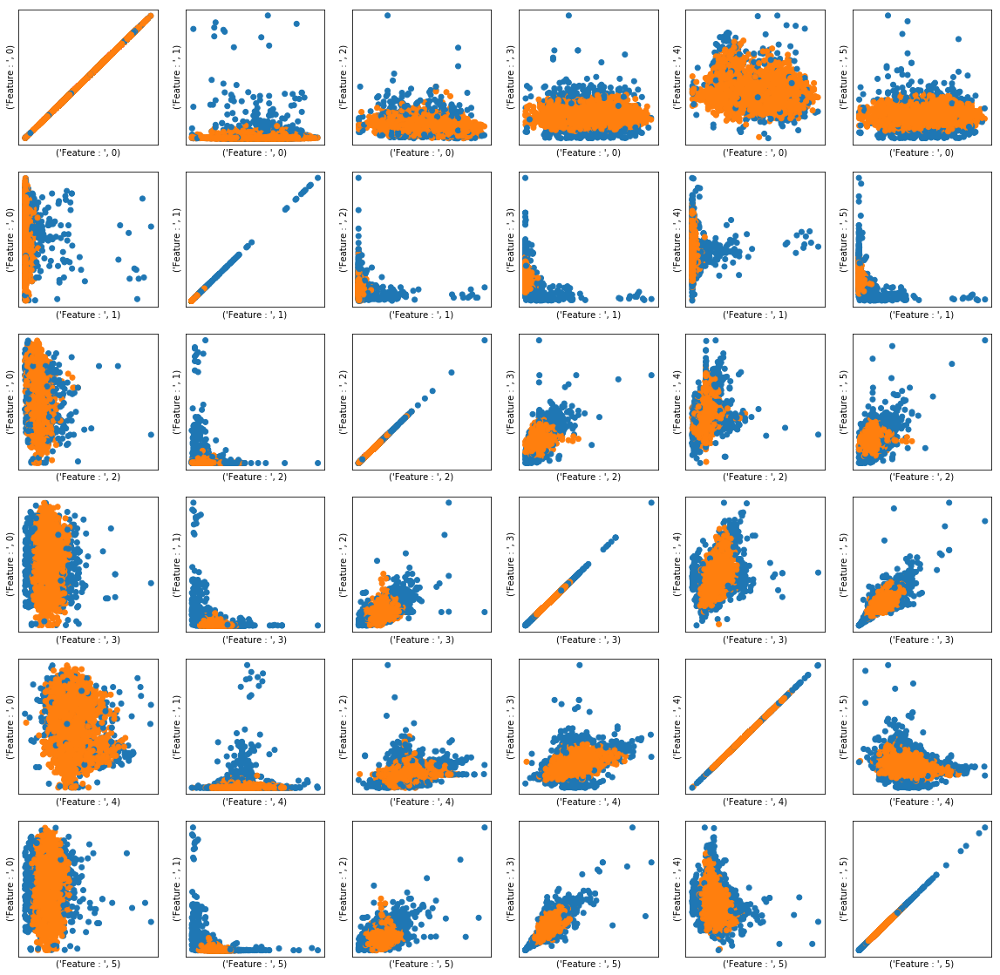

In [107]:
from sklearn.ensemble import IsolationForest
iso = IsolationForest(contamination= 0.07).fit(ann_X_scaled)
pred3 = iso.predict(ann_X_scaled)

print("Cluster Size \n ")
print(pd.Series(pred3).value_counts(normalize = True)*100)

i = 0
plt.figure(figsize=(20,20))
for col1 in ann_X_scaled.columns:
    for col2 in ann_X_scaled.columns:
        if len(inds):
            plt.subplot(6,6, i + 1)
            plt.scatter(ann_X_scaled[col1], ann_X_scaled[col2], c=plt.cm.Vega10(pred3))
            plt.xlabel(("Feature : " ,col1))
            plt.ylabel(("Feature : " ,col2))
            plt.xticks(())
            plt.yticks(())
        i = i + 1  
plt.show()

### In the analysis above we compare the performance of EllipticEnvelope, Isolation Forest and OneClassSVM. We see through the scatter plots that OneClassSVM is better at capturing the original variance of the data as compared to the other two algorithms (For example: look at the scatter plot between feature 1 and feature 4). 

#### Comparing performance using the truth values

In [118]:

# Elliptical Envelope
print("The average precision score using Elliptical Envelope is : {:.3f}".format(average_precision_score(ann_y,ee.decision_function(ann_X_scaled, raw_values= True))))
print("The AUC under the ROC curve is : {:.3f} \n".format(roc_auc_score(ann_y,ee.decision_function(ann_X_scaled, raw_values= True))))

# Oneclass SVM 
prob = (oneclass.decision_function(ann_X_scaled))
minx = MinMaxScaler()
prob = minx.fit_transform(prob)
# Isolation Tree: Replacing 1 s and 0 s with 0s and 1s as smaller avg distance indicates the points is farther away
ann_y2 = ann_y.copy()
ann_y2[0] = ann_y2[0] + 1
ann_y2[0].loc[ann_y2[0]==2] = 0
print("The average precision score using Oneclass SVM is : {:.3f}".format(average_precision_score(ann_y,prob)))
print("The AUC under the ROC curve is : {:.3f} \n".format(roc_auc_score(ann_y2,prob)))



print("The average precision score using Isolation Forest is : {:.3f}".format(average_precision_score(ann_y2,iso.decision_function(ann_X_scaled))))
print("The AUC under the ROC curve is : {:.3f} \n".format(roc_auc_score(ann_y2,iso.decision_function(ann_X_scaled))))

The average precision score using Elliptical Envelope is : 0.504
The AUC under the ROC curve is : 0.918 

The average precision score using Oneclass SVM is : 0.136
The AUC under the ROC curve is : 0.558 

The average precision score using Isolation Forest is : 0.981
The AUC under the ROC curve is : 0.812 



### As can be seen with the Elliptical Envelope has the higest  AUC and IsolationForest has the higest average precision score values.
For converting to probabilty values we have used the decision function in Elliptical Envelope (corresponds to Eucllidean distace for Raw values = True). 

In case of Isolation tree, since low average distace corresponds to farther away outliers, so we have flipped the 0 and 1 s of the y pred to make the right comparison. 

In the Oneclass SVM case, the negative values of the distance corresponds to a farther away outlier, while positive metric corresponds to inlier. Thus in this case we have flipped the signs of ground truth, also we have used MinMaxScaler to contrain the value of probability between 0s and 1s. 

### The comparison with the clustering techniques can be made using these dimentions only in the case when the number of clusters is 2, in other cases visualization of scatter plots(pair wise features) seems to be a better option.

## TASK 4: Imbalanced Classification

In [110]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import roc_auc_score, precision_score

X_train, X_test,y_train, y_test = train_test_split(ann_X_scaled, ann_y)


## Without grid search

In [111]:
## Logistic regression

logit = LogisticRegression()
logit.fit(X_train, y_train)

ann_y_logit_pred1 = logit.predict(X_test)
ann_y_logit_train1 = logit.predict(X_train)

AUC_score_logit_train1 = roc_auc_score(y_train,ann_y_logit_train1)
precision_score_logit_train1 = precision_score(y_train,ann_y_logit_train1)

AUC_score_logit_test1 = roc_auc_score(y_test,ann_y_logit_pred1)
precision_score_logit_test1 = precision_score(y_test,ann_y_logit_pred1)

print("The AUC score of logistic regression is (train): ", AUC_score_logit_train1)
print("The precision score of logistic regression is (train): ", precision_score_logit_train1)
print("\n")
print("The AUC score of logistic regression is (test): ", AUC_score_logit_test1)
print("The precision score of logistic regression is (test): ", precision_score_logit_test1)




The AUC score of logistic regression is (train):  0.706154890658
The precision score of logistic regression is (train):  0.814070351759


The AUC score of logistic regression is (test):  0.695692363065
The precision score of logistic regression is (test):  0.830985915493


## With grid search

In [112]:
## Logistic regression

param_grid_logit = {'penalty': ['l1','l2'], 'C':np.arange(0.1,1,0.1)}
logit_gs =GridSearchCV(LogisticRegression(), param_grid_logit)
logit_gs.fit(X_train, y_train)
print("Best Parameter for Logistic regression: ", logit_gs.best_params_,"\n")

logit_clf = LogisticRegression(C=0.8, penalty='l1')
logit_clf.fit(X_train, y_train)

ann_y_logit_pred = logit_clf.predict(X_test)
ann_y_logit_train = logit_clf.predict(X_train)

AUC_score_logit_train = roc_auc_score(y_train,ann_y_logit_train)
precision_score_logit_train = precision_score(y_train,ann_y_logit_train)

AUC_score_logit_test = roc_auc_score(y_test,ann_y_logit_pred)
precision_score_logit_test = precision_score(y_test,ann_y_logit_pred)

print("The AUC score of logistic regression is (train): ", AUC_score_logit_train)
print("The precision score of logistic regression is (train): ", precision_score_logit_train)
print("\n")
print("The AUC score of logistic regression is (test): ", AUC_score_logit_test)
print("The precision score of logistic regression is (test): ", precision_score_logit_test)



Best Parameter for Logistic regression:  {'penalty': 'l1', 'C': 0.59999999999999998} 

The AUC score of logistic regression is (train):  0.708745564234
The precision score of logistic regression is (train):  0.81592039801


The AUC score of logistic regression is (test):  0.699070741444
The precision score of logistic regression is (test):  0.833333333333


## Random forest classifier: Without Grid search

In [113]:
## Random Forest Classifier

rf_clf1 = RandomForestClassifier()
rf_clf1.fit(X_train, y_train)

ann_y_rf_pred1 = rf_clf1.predict(X_test)
ann_y_rf_train1= rf_clf1.predict(X_train)

AUC_score_rf_train1 = roc_auc_score(y_train,ann_y_rf_train1)
precision_score_rf_train1 = precision_score(y_train,ann_y_rf_train1)

AUC_score_rf_test1 = roc_auc_score(y_test,ann_y_rf_pred1)
precision_score_rf_test1 = precision_score(y_test,ann_y_rf_pred1)

print("The AUC score of RandomForestClassifier is (train): ", AUC_score_rf_train1)
print("The precision score of RandomForestClassifier is (train): ", precision_score_rf_train1)
print("\n")
print("The AUC score of RandomForestClassifier is (test): ", AUC_score_rf_test1)
print("The precision score of RandomForestClassifier is (test): ", precision_score_rf_test1)





The AUC score of RandomForestClassifier is (train):  0.997110164079
The precision score of RandomForestClassifier is (train):  0.992248062016


The AUC score of RandomForestClassifier is (test):  0.956179242196
The precision score of RandomForestClassifier is (test):  0.861635220126


In [114]:
## Random Forest Classifier

param_grid_rf = {'max_depth' : np.arange(5,20,5)}
rf_gs =GridSearchCV(RandomForestClassifier(), param_grid_rf)
rf_gs.fit(X_train, y_train)
print("Best Parameter for RandomForestClassifier: ", rf_gs.best_params_,"\n")

rf_clf = RandomForestClassifier(max_depth=10)
rf_clf.fit(X_train, y_train)

ann_y_rf_pred = rf_clf.predict(X_test)
ann_y_rf_train = rf_clf.predict(X_train)

AUC_score_rf_train = roc_auc_score(y_train,ann_y_rf_train)
precision_score_rf_train = precision_score(y_train,ann_y_rf_train)

AUC_score_rf_test = roc_auc_score(y_test,ann_y_rf_pred)
precision_score_rf_test = precision_score(y_test,ann_y_rf_pred)

print("The AUC score of RandomForestClassifier is (train): ", AUC_score_rf_train)
print("The precision score of RandomForestClassifier is (train): ", precision_score_rf_train)
print("\n")
print("The AUC score of RandomForestClassifier is (test): ", AUC_score_rf_test)
print("The precision score of RandomForestClassifier is (test): ", precision_score_rf_test)




Best Parameter for RandomForestClassifier:  {'max_depth': 10} 

The AUC score of RandomForestClassifier is (train):  0.995115748443
The precision score of RandomForestClassifier is (train):  0.943488943489


The AUC score of RandomForestClassifier is (test):  0.979222563968
The precision score of RandomForestClassifier is (test):  0.857142857143


### Undersampling majority class

In [115]:

from imblearn.under_sampling import RandomUnderSampler
rus = RandomUnderSampler(return_indices=True)
X_resampled, y_resampled, idx_resampled = rus.fit_sample(X_train, y_train)

X_resampled= pd.DataFrame(X_resampled)
y_resampled= pd.DataFrame(y_resampled)

print("Resample size : \n", y_resampled[0].value_counts())

Resample size : 
 1    386
0    386
Name: 0, dtype: int64


In [116]:
## Logistic regression

param_grid_logit = {'penalty': ['l1','l2'], 'C':np.arange(0.1,1,0.1)}
logit_gs =GridSearchCV(LogisticRegression(), param_grid_logit)
logit_gs.fit(X_resampled, y_resampled)
print("Best Parameter for Logistic regression: ", logit_gs.best_params_,"\n")

logit_clf = LogisticRegression(C=0.3, penalty='l1')
logit_clf.fit(X_resampled, y_resampled)

ann_y_logit_pred = logit_clf.predict(X_test)
ann_y_logit_train = logit_clf.predict(X_resampled)

AUC_score_logit_train = roc_auc_score(y_resampled,ann_y_logit_train)
precision_score_logit_train = precision_score(y_resampled,ann_y_logit_train)

AUC_score_logit_test = roc_auc_score(y_test,ann_y_logit_pred)
precision_score_logit_test = precision_score(y_test,ann_y_logit_pred)

print("The AUC score of logistic regression is (train): ", AUC_score_logit_train)
print("The precision score of logistic regression is (train): ", precision_score_logit_train)
print("\n")
print("The AUC score of logistic regression is (test): ", AUC_score_logit_test)
print("The precision score of logistic regression is (test): ", precision_score_logit_test)



Best Parameter for Logistic regression:  {'penalty': 'l1', 'C': 0.20000000000000001} 

The AUC score of logistic regression is (train):  0.988341968912
The precision score of logistic regression is (train):  0.977215189873


The AUC score of logistic regression is (test):  0.97911622276
The precision score of logistic regression is (test):  0.68202764977


In [117]:
## Random Forest Classifier

param_grid_rf = {'max_depth' : np.arange(5,20,5)}
rf_gs =GridSearchCV(RandomForestClassifier(), param_grid_rf)
rf_gs.fit(X_resampled, y_resampled)
print("Best Parameter for RandomForestClassifier: ", rf_gs.best_params_,"\n")

rf_clf = RandomForestClassifier(max_depth=5)
rf_clf.fit(X_resampled, y_resampled)

ann_y_rf_pred = rf_clf.predict(X_test)
ann_y_rf_train = rf_clf.predict(X_resampled)

AUC_score_rf_train = roc_auc_score(y_resampled,ann_y_rf_train)
precision_score_rf_train = precision_score(y_resampled,ann_y_rf_train)

AUC_score_rf_test = roc_auc_score(y_test,ann_y_rf_pred)
precision_score_rf_test = precision_score(y_test,ann_y_rf_pred)

print("The AUC score of RandomForestClassifier is (train): {:.3f}".format(AUC_score_rf_train))
print("The precision score of RandomForestClassifier is (train): {:.3f}".format(precision_score_rf_train))
print("\n")
print("The AUC score of RandomForestClassifier is (test): {:.3f}".format(AUC_score_rf_test))
print("The precision score of RandomForestClassifier is (test): {:.3f}".format(precision_score_rf_test))




Best Parameter for RandomForestClassifier:  {'max_depth': 5} 

The AUC score of RandomForestClassifier is (train): 0.995
The precision score of RandomForestClassifier is (train): 0.990


The AUC score of RandomForestClassifier is (test): 0.984
The precision score of RandomForestClassifier is (test): 0.733


### Compare AUC and precision scores with TASK 3 results

The best AUC in the unsuperwised outlier detection approaches was given by Elliptical Envelope approach as 0.91. In the above approaches, without hyperparameter tuning, Logistic has a test AUC of 0.72 whicle RandomForest approach has a AUC of 0.95. So in this case the Elliptical Envelope approach does better than logistic Regression. However Random forest does slightly better than Elliptical envelope.

After Gridsearch however, both the supervised classifications do better than the outlier detection approaches in terms of the AUC. 

The precison score of the Isolation Tree approach is 0.98 which is better than the superwised methods in the test case senario. 

Changing the class-weight to “balanced" helps with increasing the AUC for logistic and RandomForest, however the precison score does not increase. 